# BWFields Manual

## Installation and Usage of BWFields

In [3]:
# pip install FacetClumps==0.0.9
# pip install DPConCFil==0.0.6
# pip install BWFields==0.0.1

## The imported dependent packages

Dependencies for the manual

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

import astropy.io.fits as fits
from spectral_cube import SpectralCube
from astropy import units as u

import copy
import pickle
import warnings
warnings.filterwarnings("ignore")

import scienceplots
plt.style.use(['science', 'nature', 'no-latex'])
plt.rc('figure', dpi=300)
plt.rc('figure', figsize=(2.5, 2))

## The reference of the Example data 

Example file is the $^{13}CO$ ($J = 1-0$) emission line of the Milky Way Imaging Scroll Painting (MWISP) within $15.5^{\circ} \leq l \leq 18.5^{\circ}$, $-0.1^{\circ} \leq b \leq 1.6^{\circ}$ and -10 km s$^{-1}$ $\leq v \leq$ 50 km s$^{-1}$. 

MWISP project is a multi-line survey in $^{12}CO$/$^{13}CO$/$C^{18}O$ along the northern galactic plane with PMO-13.7m telescope.

In [8]:
# file_example = 'M16'
# file_name = "../../Data/MWISP_Cube/Bubble_Cube_{}_13CO.fits".format(file_example)

file_example = 'G201_13CO'
file_name = "../../Data/MWISP_Cube/{}.fits".format(file_example)

cube = SpectralCube.read(file_name)
print(cube)

SpectralCube with shape=(302, 121, 145):
 n_x:    145  type_x: GLON-CAR  unit_x: deg    range:   201.000000 deg:  202.200000 deg
 n_y:    121  type_y: GLAT-CAR  unit_y: deg    range:    -0.300000 deg:    0.700000 deg
 n_s:    302  type_s: VELO      unit_s: m / s  range:    -9962.425 m / s:   40015.741 m / s


The center and radius of the bubble N19 from Churchwell et al. (2006).

In [15]:
com_RT_N19  = np.array([17.077,  0.946,  0.   ,  4.45 ])

## FacetClumps

Please see [DPConCFil](https://github.com/JiangYuTS/DPConCFil/blob/main/Manuals/DPConCFil_Manual.ipynb ) for more details about clump class.

Customized classes and functions

In [21]:
import DPConCFil

from DPConCFil.Clump_Class import *
from DPConCFil.Filament_Class import *
from DPConCFil import Plot_and_Save_Funs
from DPConCFil import Profile_Funs

The parameters of FacetClumps. Please see the introduction of [FacetClumps](https://github.com/JiangYuTS/FacetClumps/blob/master/Examples/Examples_Files_FacetClumps.ipynb) for more details.

In [24]:
SWindow = 3 # [3,5,7]
KBins = 35 # [10,...,60]
FwhmBeam = 2
VeloRes = 2
SRecursionLBV = [16, 5] # [(2+FwhmBeam)**2,3+VeloRes]

header = fits.getheader(file_name)
# RMS = header['RMS']
RMS = 0.217858
# RMS = 1
Threshold = 5 * RMS

parameters_FacetClumps = [RMS, Threshold, SWindow, KBins, FwhmBeam, VeloRes, SRecursionLBV]

Construct clump objects. These file names are necessary parameters.

**file_name**: File name.

**mask_name**: Mask name, the file use to store the region information or store the region information. 

**outcat_name**: The file used to store clump table in pixel coordinate system.

**outcat_wcs_name**: The file used to store clump table in WCS coordinate system.

In [30]:
mask_name = '../Example_Files/Clump/mask_{}.fits'.format(file_example)
outcat_name = '../Example_Files/Clump/outcat_{}.csv'.format(file_example)
outcat_wcs_name = '../Example_Files/Clump/outcat_wcs_{}.csv'.format(file_example)

In [32]:
clumpsObj = ClumpInfor(file_name,mask_name,outcat_name,outcat_wcs_name)

### Calculate the clump information from FacetClumps. 

In this case, the parameters of FacetClumps is essential. More clump detection algorithms can also be added to this process. 

The angle of the clumps detected by FacetClumps is obtained by diagonalizing the moment of inertia matrix. For more details, please refer to the article [FacetClumps](https://iopscience.iop.org/article/10.3847/1538-4365/acda89). Performing a two-dimensional single Gaussian fitting on the velocity integrated map of a clump can provide more accurate position and direction information of the clump in spatial direction. 

When 'fit_flag=True', it indicates that the fitting will be used. 

In [36]:
clumpsObj.Cal_Infor_From_Mask_Or_Algorithm(mask_or_algorithm='FacetClumps',parameters=parameters_FacetClumps)
clumpsObj.Get_Clumps_Infor(sr_origin = False, fit_flag = True, ErosedK = 2)   

100%|█████████████████████████████████████████████████| 7/7 [00:00<00:00, 48.77it/s]


Number: 62
Time: 4.33


100%|██████████████████████████████████████████████| 62/62 [00:00<00:00, 176.35it/s]

Fitting Clumps Time: 0.35


### Calculate the clump information from the mask file 'mask_name'. 

The mask is the region information of clumps, which can be obtained by any clump detection algorithm.

In [39]:
# clumpsObj.Cal_Infor_From_Mask_Or_Algorithm(mask_or_algorithm='mask')
# clumpsObj.Get_Clumps_Infor(sr_origin = False, fit_flag = True, ErosedK = 2)    

Plot the original image. If save_path=None, the image will not be saved.

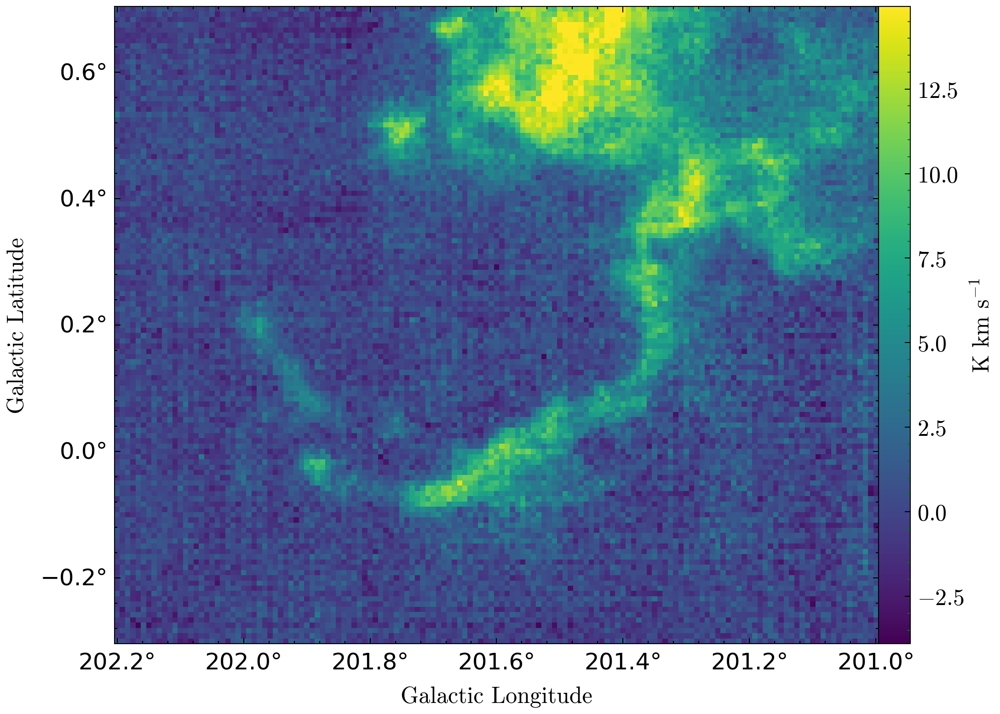

In [42]:
img_name = 'M16'

save_path = '../Images/Imgs_OD/Example_Data_{}.pdf'.format(img_name)
save_path = None
Plot_and_Save_Funs.Plot_Origin_Data(clumpsObj, figsize=(14, 6), fontsize=12,cmap='viridis',tick_logic=True,cbar_logic=True,\
                     spacing=None,save_path=save_path)

plt.show()

Plot the detection results and save the image. 

The total number of clumps is 1154, with 963 of them not touching the edge. The red asterisks denote the central position of the clumps, and the red lines denote the direction of the principal axis of the clumps.

In [48]:
edges = clumpsObj.edges
print('Total number:',len(edges))
print('NO edges number:',np.where(edges==0)[0].shape[0])

Total number: 62
NO edges number: 45


In [51]:
clump_angles = clumpsObj.angles
clump_edges = clumpsObj.edges
clump_centers = clumpsObj.centers
clump_centers_wcs = clumpsObj.centers_wcs
origin_data = clumpsObj.origin_data

regions_data = clumpsObj.regions_data
regions_list = clumpsObj.regions_list
srs_array = clumpsObj.signal_regions_array
srs_list = clumpsObj.signal_regions_list
data_wcs = clumpsObj.data_wcs
connected_ids_dict = clumpsObj.connected_ids_dict
con_ids_dict_enhanced = clumpsObj.connected_ids_dict_lists[2]
clump_coords_dict = clumpsObj.clump_coords_dict
rc_dict = clumpsObj.rc_dict

clumps_data = np.zeros_like(origin_data)
clumps_data[regions_data>0] = origin_data[regions_data>0]

# clumps_data = np.zeros_like(origin_data)
# clumps_data[srs_array==33] = origin_data[srs_array==33]

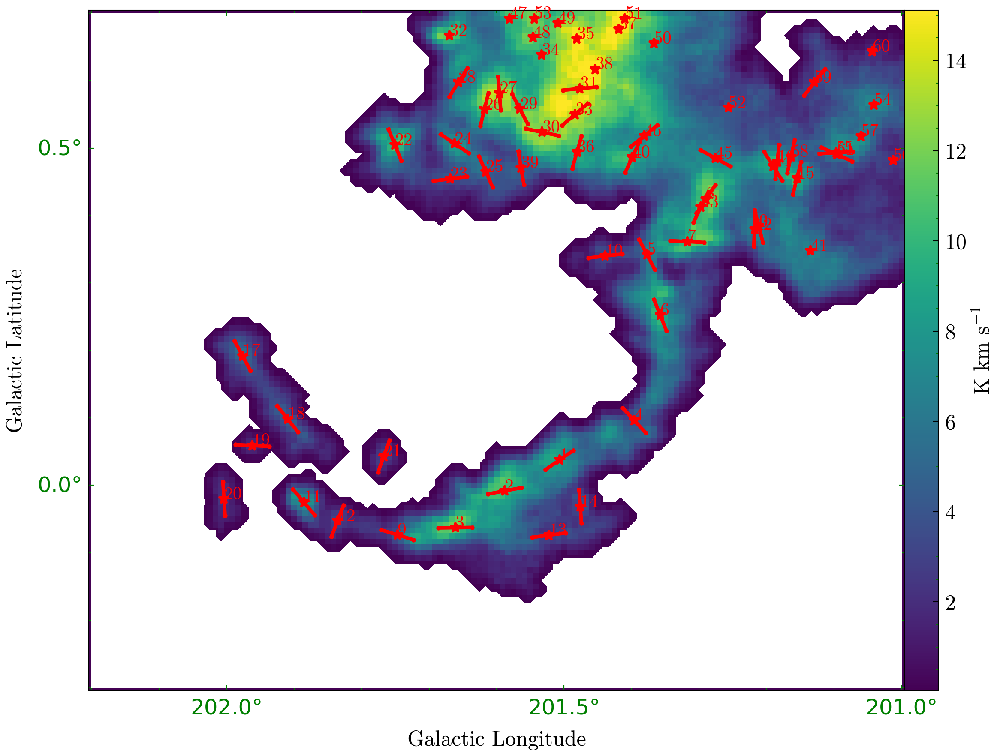

In [54]:
save_path = '../Images/Clumps_Infor.pdf'
Plot_and_Save_Funs.Plot_Clumps_Infor(clumpsObj,clump_ids=None,figsize=(12, 6),line_scale=3,num_text=True,\
                                        tick_logic=True,cbar_logic=True,fontsize=12,spacing=30*u.arcmin,save_path=None)
plt.show()

## BWFields

Import custom functions and classes from BWFields_Code library

In [60]:
import sys

sys.path.append('..')

# import BWFields

# or

import BWFields_Code

from BWFields_Code.Bubble_Class import *
from BWFields_Code import Bubble_Class
from BWFields_Code import Bubble_Funs_Morphology as BFM
from BWFields_Code import Bubble_Funs_PV as BFPV      
from BWFields_Code import Bubble_Funs_Table as BFT  
from BWFields_Code import Bubble_Funs_Profile as BFPr
from BWFields_Code import Bubble_Funs_Skeleton as BFS
from BWFields_Code import Bubble_Funs_Plot as BFPl
from BWFields_Code import Bubble_Funs_Tools as BFTools
from BWFields_Code import Bubble_Funs_Detect as BFD

from BWFields_Code import MeerKAT_Code as MKCode
from BWFields_Code import Spitzer_Code as SpCode
from BWFields_Code import Heschel_Code as HeCode

from BWFields_Code.Bubble_Funs_Morphology import *
from BWFields_Code.Bubble_Funs_Skeleton import *
from BWFields_Code.Bubble_Funs_PV import *
from BWFields_Code.Bubble_Funs_Profile import *
from BWFields_Code.Bubble_Funs_Plot import *

Select clumps around fragmented shells.

In [69]:
# used_ids_1 = clump_centers_wcs[:,0]<16.3
used_ids_2 = clump_centers_wcs[:,0]>201.2
used_ids_3 = clump_centers_wcs[:,1]<0.6
# used_ids_4 = clump_centers_wcs[:,1]>0.7
# used_ids_5 = clump_centers_wcs[:,2]<30
# used_ids_6 = clump_centers_wcs[:,2]>10
used_ids = used_ids_2&used_ids_3 #used_ids_1&used_ids_2&used_ids_3 &used_ids_4&used_ids_5&used_ids_6
clump_ids_sub = np.where(used_ids)[0]


clump_coords, clump_items, data_wcs_item, regions_data_T, start_coords, \
             clump_items_mask_2D, lb_area = FCFA.Filament_Coords(origin_data, \
             regions_data, data_wcs, clump_coords_dict, clump_ids_sub, CalSub=False)

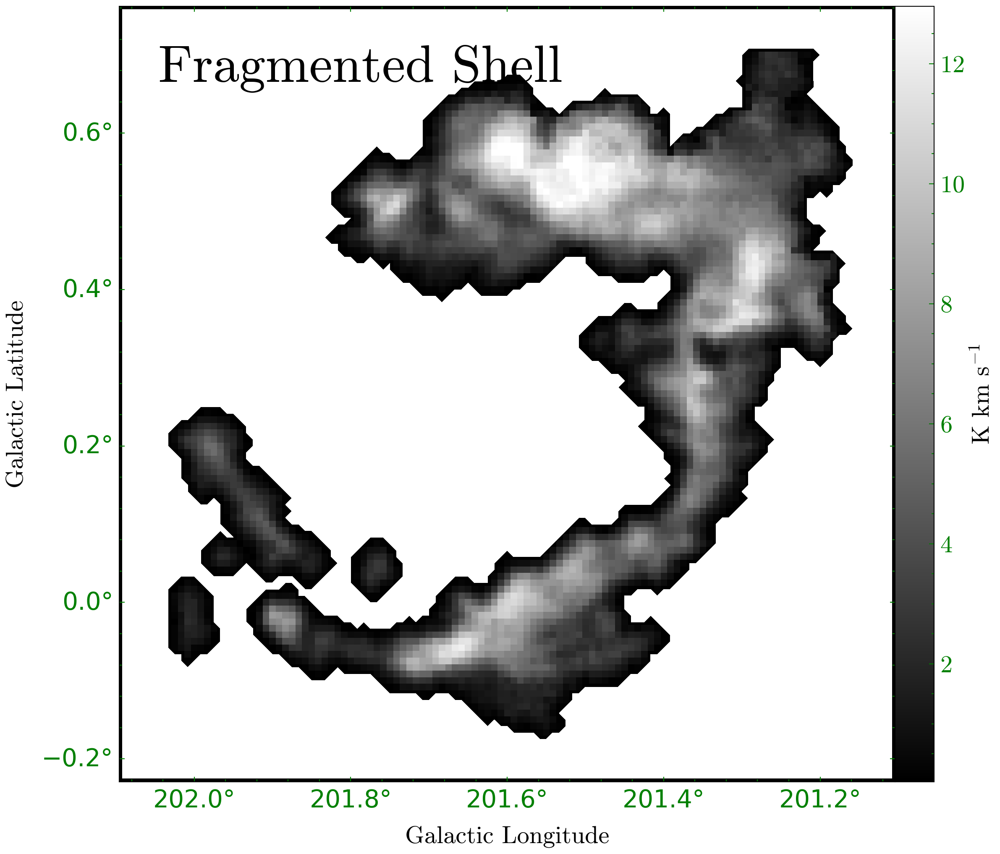

In [75]:
clump_items,start_coords,ax0 = Plot_Clumps_Infor_By_Ids(clumpsObj,clump_ids_sub,ax0=None,figsize=(12,8),plot_clump=False,plot_contour=False,tick_logic=True,cbar_logic=True,\
                             fontsize=14,cmap='gray',colors='red',num_text=False,line_scale=3,linewidth=2)


ax0.text(0.05, 0.95, 'Fragmented Shell', color='black',transform=ax0.transAxes, verticalalignment='top', fontsize=30)
save_path = '../Images/Imgs_Mor/G201.pdf'
# if save_path != None:
#     plt.savefig(save_path, format='pdf', dpi=500)
plt.show()

In [77]:
clump_items_mbc, start_coords, data_wcs_mbc = BFTools.Get_Min_Bounding_Cuboid(clumpsObj,clump_ids_sub)

# data_header_sub = data_wcs_mbc.to_header()
# file_name_sub = '../../Data/MWISP_Cube/G17_Fragmented_Shell.fits'

# BFTools.Save_Fits(clump_items_mbc,data_header_sub,file_name_sub)

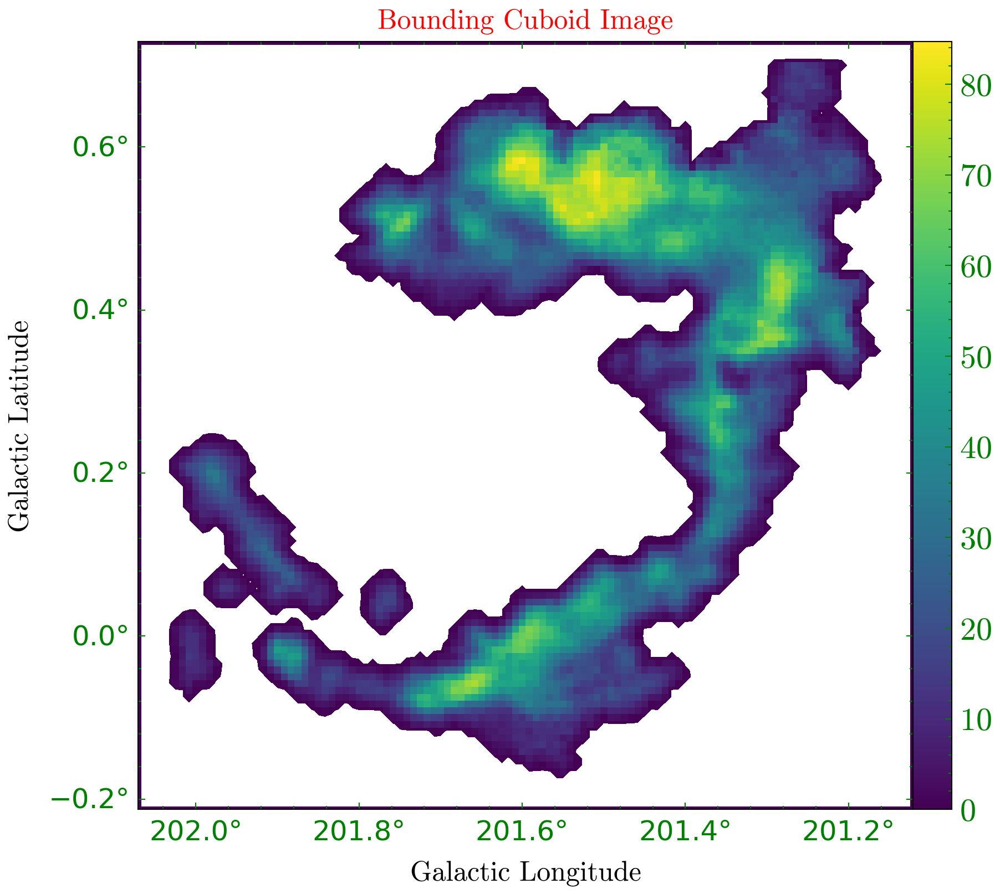

In [81]:
ax0 = Plot_Images_2D(clump_items_mbc.sum(0),ax0=None,figsize=(10,6),data_wcs=data_wcs_mbc,tick_logic=True,\
                     fontsize=12,title='Bounding Cuboid Image')

Set the parameters for the bubble analysis. (The detection function still needs to be executed.)

In [83]:
# These parameters are essential for bubble detection and morphological analysis
Threshold = 5 * RMS  # Define the threshold as 5 times the RMS value, for signal region detection
FilSigma = 2 * RMS  # Set Sigma to 2 times RMS, used in Gaussian filtering for signal region
SliceDV = 12  # Set the velocity slice width in pixels (about 2 km/s for MWISP), which determines the velocity resolution
BubSizeLBV = [16, 5]  # Set the size of the bubble
BubWeight = 0  # Set the weight of the bubble, typically used in weighting bubble regions

# Collect these parameters into a list for easy reference in subsequent analysis
parameters_Bubble = [RMS, Threshold, FilSigma, SliceDV, BubSizeLBV[0], BubWeight]

# Set up FacetClump detection parameters, set to False to not use FacetClumps for bubble detection
FacetClump_detect = False  # Whether to use FacetClumps for detection or not

# Weight and other parameters for bubble detection
ThresholdW = BubWeight  # The weight parameter used in bubble detection
MergeOR = 0  # Overlap ratio for merging bubbles, typically set to 0 for no merging

# Combine the parameters for FacetClumps and bubble detection into one list
par_FacetClumps_bub = [FacetClump_detect, ThresholdW, BubSizeLBV, MergeOR]

# Set the bubble file index for naming files
mask_name_bub = '../Example_Files/Bubble/Bubble_13CO_Mask_{}.fits'.format(file_example)  # Path to the mask file used in detection
bubble_weight_data_name = '../Example_Files/Bubble/Bubble_13CO_Weight_Data_{}.fits'.format(file_example)  # Path to the weight data
bubble_table_pix_name = '../Example_Files/Bubble/Bubble_13CO_Table_Pix_{}.csv'.format(file_example)  # Table for bubble pixel coordinates
bubble_table_wcs_name = '../Example_Files/Bubble/Bubble_13CO_Table_WCS_{}.csv'.format(file_example)  # Table for bubble WCS coordinates
bubble_infor_name = '../Example_Files/Bubble/Bubble_13CO_Infor_{}'.format(file_example)  # Path to store bubble information

# Combine file paths into a list for saving outputs
save_files = [mask_name_bub, bubble_weight_data_name, bubble_table_pix_name, bubble_table_wcs_name, bubble_infor_name]

# Initialize the BubbleInfor object with the clumps information and parameters
bubbleObj = BubbleInfor(clumpsObj, parameters_Bubble, save_files, pix_scale_arcmin=None)

100%|█████████████████████████████████████████████████| 7/7 [00:05<00:00,  1.27it/s]


Number: 19
Time: 5.6


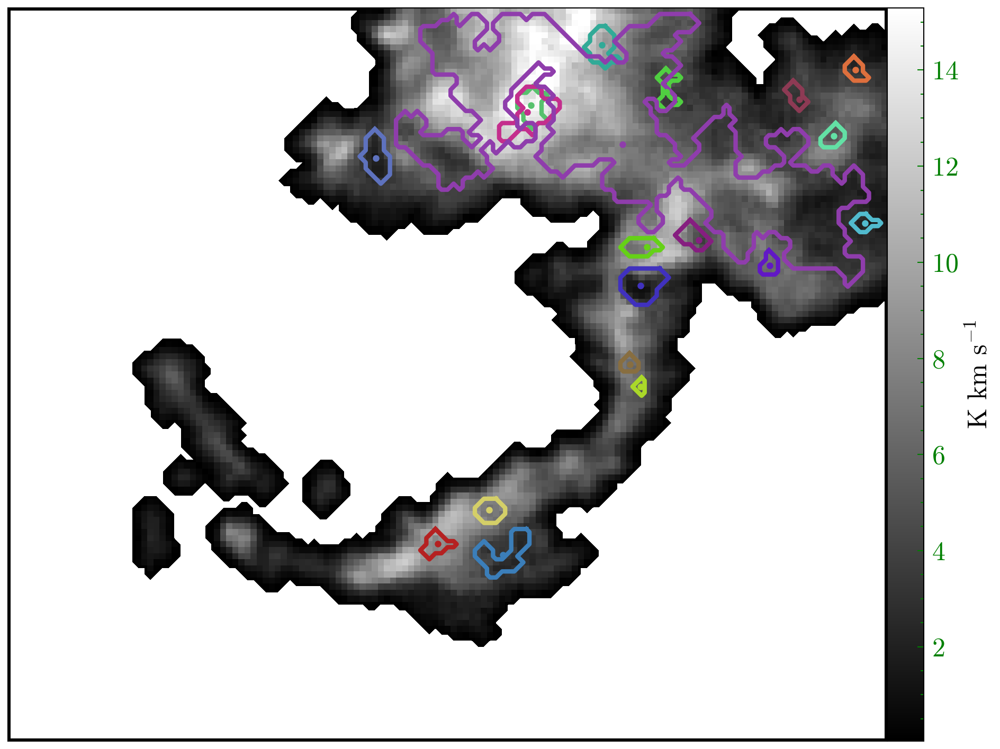

In [93]:
# Perform the morphological analysis for the bubbles using the provided parameters
# The Bubble_Morphology function takes in the weight data, regions data, bubble coordinates, and the FacetClumps parameters for processing

srs_ids = None
bubbleObj.Bubble_Morphology(bubble_weight_data=None,bubble_regions_data=None,bubbles_coords=None, \
                            srs_ids=srs_ids, par_FacetClumps_bub=par_FacetClumps_bub)

# The function processes the bubble morphology and performs necessary calculations such as bubble size, shape, and orientation
# The results are stored in the bubble object, which will be used for further analysis

# # Normalize the bubble weight data by scaling it to a range of 0 to 100
# bubble_weight_data = bubbleObj.bubble_weight_data
# bubble_weight_data = bubble_weight_data / bubble_weight_data.max() * 100
# bubbleObj.bubble_weight_data = bubble_weight_data

# Plot the inner contours of the bubble with specified styling options
ax0 = BFPl.Plot_Bubble_Inner_Contours(
    bubbleObj, bg_data=1, clump_ids=None, bubble_valid_ids=None, num_text=False, cmap='gray', 
    tick_logic=False,cbar_logic=True,linewidth=2, ax0=None, figsize=(14, 6), markersize=2, fontsize=12
)

# This will plot the inner contours of the bubble with a gray color map and the specified plotting parameters

# Coordinates for the bubble (example: N19)
# com_RT = com_RT_N19  # Set the coordinates for the specific bubble (e.g., N19)
# com_LBV_pix = BFTools.Translate_Coords_LBV([com_RT[:3]], bubbleObj.clumpsObj.data_wcs, pix2world=False, world2pix=True)
# pixel_x, pixel_y = com_LBV_pix[0][0], com_LBV_pix[0][1]
# radius = com_RT[3] / 0.5  # Calculate the radius based on a given scale

# # Mark the bubble's position and its size on the plot
# ax0.scatter(pixel_x, pixel_y, color='red', marker='x', s=20)  # Mark the center of the bubble with a red 'x'
# bubble_circle = Circle((pixel_x, pixel_y), radius, fill=False, color='red', linewidth=2, linestyle='-.', zorder=3)
# ax0.add_patch(bubble_circle)  # Add a circle indicating the bubble's extent to the plot
# ax0.annotate('N19', xy=(pixel_x, pixel_y), xytext=(135, 131), color='red', fontsize=14,
#              arrowprops=dict(facecolor='lime', shrink=0.001, width=2, headwidth=3))
# Annotate the bubble with its label ('N19') and draw an arrow pointing to its center

# Save or display the figure depending on the provided save path
# The plot shows the inner contours of the bubble with overlaid annotations
# Uncomment the following lines to save the figure
img_name = 'G17'
# save_path = '../Images/Imgs_Mor/Weight_Data_{}.pdf'.format(img_name)
# if save_path is not None:
#     plt.savefig(save_path, format='pdf', dpi=500)
plt.show()  

In [95]:
# Perform further analysis of bubble morphology by adjusting parameters
Threshold = 5 * RMS  # Define the threshold as 5 times the RMS value, for signal region detection
FilSigma = 2 * RMS  # Set Sigma to 2 times RMS, used in Gaussian filtering for signal region
SliceDV = 12  # Set the velocity slice width in pixels (about 2 km/s for MWISP), which determines the velocity resolution
BubSizeLBV = [16, 5]  # Set the size of the bubble
BubWeight = 4  # Set a weight threshold for bubble weight data

# Update the list of parameters for the new bubble analysis
parameters_Bubble = [RMS, Threshold, FilSigma, SliceDV, BubSizeLBV[0], BubWeight]

# Set parameters for FacetClump detection
FacetClump_detect = True  # Now set to True to use FacetClumps for bubble detection

# Set new weights and other parameters for bubble detection
ThresholdW = BubWeight
MergeOR = 0.4  # Adjust the merging overlap ratio parameter

# Create a new parameter list for bubble detection
par_FacetClumps_bub = [FacetClump_detect, ThresholdW, BubSizeLBV, MergeOR]

# Define new bubble index and file paths for saving the results
mask_name_bub = '../Example_Files/Bubble/Bubble_13CO_Mask_{}.fits'.format(file_example)  # Path to the mask file used in detection
bubble_weight_data_name = '../Example_Files/Bubble/Bubble_13CO_Weight_Data_{}.fits'.format(file_example)  # Path to the weight data
bubble_table_pix_name = '../Example_Files/Bubble/Bubble_13CO_Table_Pix_{}.csv'.format(file_example)  # Table for bubble pixel coordinates
bubble_table_wcs_name = '../Example_Files/Bubble/Bubble_13CO_Table_WCS_{}.csv'.format(file_example)  # Table for bubble WCS coordinates
bubble_infor_name = '../Example_Files/Bubble/Bubble_13CO_Infor_{}'.format(file_example)  # Path to store bubble information

# Combine the file paths into a list for saving outputs
save_files = [mask_name, bubble_weight_data_name, bubble_table_pix_name, bubble_table_wcs_name, bubble_infor_name]

# Initialize the BubbleInfor object with new parameters for bubble analysis
bubbleObj = BubbleInfor(clumpsObj, parameters_Bubble, save_files, pix_scale_arcmin=0.5)

# Perform bubble morphology analysis with updated parameters
bubbleObj.Bubble_Morphology(bubble_weight_data=None, bubble_regions_data=None, 
                            bubbles_coords=None, srs_ids=None, par_FacetClumps_bub=par_FacetClumps_bub)
# This step processes the bubble data using the new parameters and outputs the results

100%|█████████████████████████████████████████████████| 7/7 [00:05<00:00,  1.26it/s]


Number: 23
Time: 6.52


`bg_data=1` refers as background data is molecular gas.

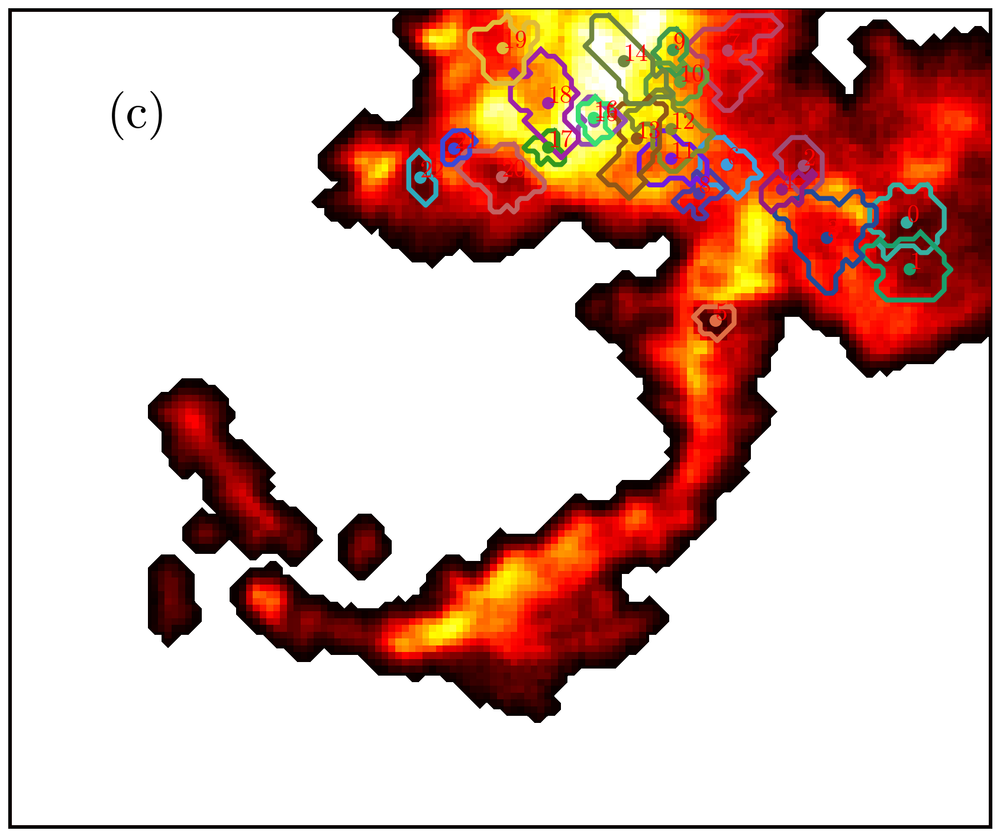

In [97]:
# Plot the inner clumps in the bubble region after bubble detection
# This section involves plotting the inner clumps within the bubble region and generating detailed clump plots.

# Plot the inner clumps of the bubble using the specified parameters
ax0 = BFPl.Plot_Bubble_Inner_Contours(
    bubbleObj, bg_data=1, num_text=True, cmap='hot', tick_logic=False, cbar_logic=False,
    linewidth=2, figsize=(8, 6), markersize=4, fontsize=12
)
# This function generates a plot showing the inner contours of the bubble, highlighting the clumps in the bubble region
# The plot uses a 'hot' color map, displays numerical text labels for the clumps, and adjusts the line width and marker size.

# Annotate the plot with a label
ax0.text(0.1, 0.9, '(c)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
# The plot is annotated with the label '(c)' in the top-left corner for easy identification

# Save or display the plot
save_path = '../Images/Imgs_Mor/Inner_Clumps_{}.pdf'.format(img_name)
# If save_path is provided, save the inner clumps plot as a PDF file
# if save_path is not None:
#     plt.savefig(save_path, format='pdf', dpi=500)
plt.show() 

`bg_data=2` refers as background data is weight data.

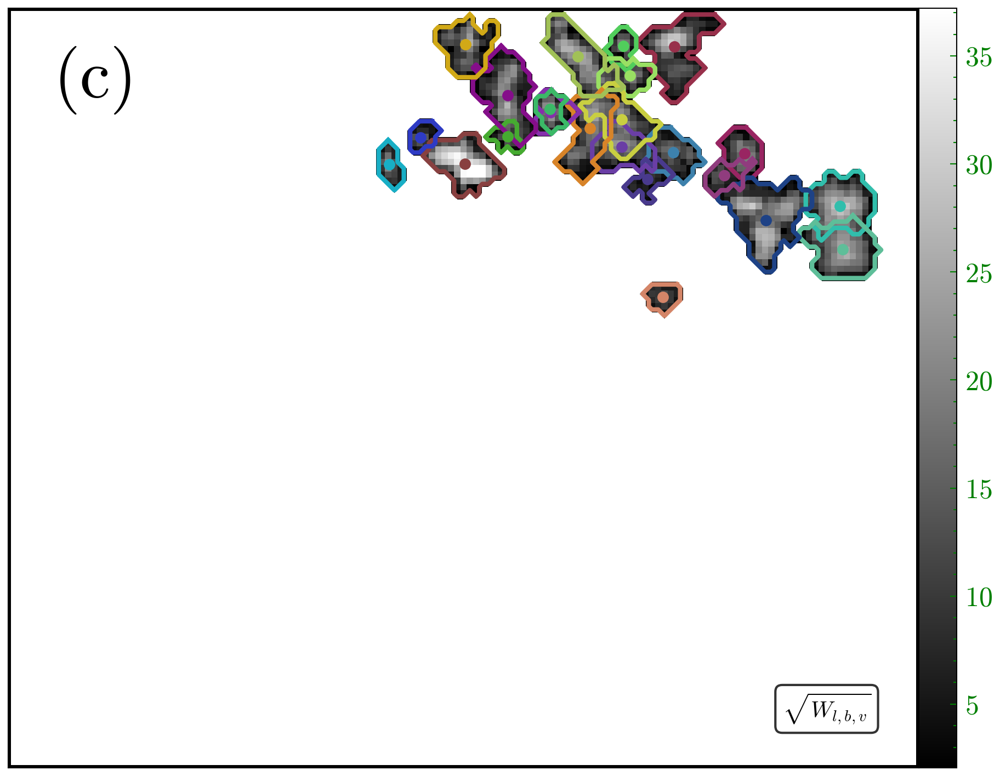

In [99]:
ax0 = BFPl.Plot_Bubble_Inner_Contours(bubbleObj,bg_data=2,num_text=False,cmap='gray',tick_logic=False,cbar_logic=True,\
                                      linewidth=2,figsize=(14,6),markersize=4,fontsize=12)

# bub_id = 30
# ax0.annotate('N19-A',xy=(bubble_coms[bub_id][2],bubble_coms[bub_id][1]),xytext=(42,98),\
#              color='red',fontsize=14,arrowprops=dict(facecolor='lime',shrink=0.001,width=2,headwidth=3))

ax0.text(0.05, 0.95, '(c)', color='black',transform=ax0.transAxes, verticalalignment='top', fontsize=30)

# save_path = '../Images/Imgs_Mor/Inner_Clumps_{}.pdf'.format(img_name)
# if save_path != None:
#     plt.savefig(save_path, format='pdf', dpi=500)
plt.show()

In [101]:
bubble_coms = bubbleObj.bubble_coms
bubble_coms_wcs = bubbleObj.bubble_coms_wcs
ranges_v = bubbleObj.ranges_v
ranges_v_wcs = bubbleObj.ranges_v_wcs
contours = bubbleObj.contours
eccentricities_lb = bubbleObj.eccentricities_lb
confidences = bubbleObj.confidences

bubble_regions_data = bubbleObj.bubble_regions_data
bubble_weight_data = bubbleObj.bubble_weight_data
bubble_regions = bubbleObj.bubble_regions
bubbles_coords = bubbleObj.bubbles_coords

Save bub_clumps_dict.

In [109]:
bub_clumps_dict = defaultdict(list)
for index in range(len(bubbleObj.bubble_coms_wcs)):
    # print('Index:',index)
    dictionary_cuts = defaultdict(list)
    bubbleObj.Get_Bubble_Item_Morphology(index, dictionary_cuts)

    bubble_clump_ids = bubbleObj.bubble_clump_ids  # IDs of detected bubble clumps
    bubble_clump_ids_con = bubbleObj.bubble_clump_ids_con  # Connected clump IDs
    bub_clumps_dict[index].append(bubble_clump_ids)
    bub_clumps_dict[index].append(bubble_clump_ids_con)

import pickle
file_name_bub_clumps_dict = "../Example_Files/Tables/bub_clumps_dict_{}.pkl".format(file_example)
with open(file_name_bub_clumps_dict, "wb") as f:
    pickle.dump(bub_clumps_dict, f)

# with open(file_name_bub_clumps_dict, "rb") as f:
#     bub_clumps_dict = pickle.load(f)

### Analysis a signal bubble item.

In [111]:
# Initialize bubble information (can be provided for further analysis)
bubble_clump_ids_p = clump_ids_sub  # Clump IDs for bubble
bubble_com_pi = None  # Placeholder for bubble center information (pixels)
bubble_com_wcs_pi = None  # Placeholder for bubble center information (WCS)
bubble_radius_p = None  # Placeholder for bubble radius
bubble_infor_provided = [bubble_clump_ids_p, bubble_com_pi, bubble_com_wcs_pi, bubble_radius_p]
# bubble_infor_provided = None  # No initial bubble information provided

# Set parameters for bubble morphology analysis
index = 0  # Set the bubble index to analyze (start for 0)
add_con = False  # Do not include connected gas clumps (blue clumps)
fixed_ec = True  # Keep fitted ellipse center fixed
half_ecoords = True  # Use half ellipse coordinates for the bubble analysis
systemic_v_type = 1  # Set the systemic velocity type for the bubble (see Get_Bubble_Gas_Infor)
ellipse_start_type = 'max' #Reorder ellipse contour coordinates (see Resort_Ellipse_Coords)

# Analyze bubble morphology and store results in dictionary_cuts
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords, ellipse_start_type=ellipse_start_type
)

# Extract bubble data for further analysis
# bubble_inner_data_item = bubbleObj.bubble_inner_data_item  # Inner bubble data
# bubble_inner_region_item = bubbleObj.bubble_inner_region_item  # Inner region data
# start_coords_inner = bubbleObj.start_coords_inner  # Starting coordinates for inner data
bubble_clump_ids = bubbleObj.bubble_clump_ids  # IDs of detected bubble clumps
bubble_clump_ids_con = bubbleObj.bubble_clump_ids_con  # Connected clump IDs

# Extract bubble coordinates and other data
bubble_coords = bubbleObj.bubble_coords  # Coordinates of the bubble cavity
bubble_com_item = bubbleObj.bubble_com_item  # Center of mass (item coordinates)
bubble_com_item_wcs = bubbleObj.bubble_com_item_wcs  # Center of mass (WCS coordinates)
bubble_item = bubbleObj.bubble_item  # Bubble data item
data_wcs_item = bubbleObj.data_wcs_item  # WCS data item
regions_data_i = bubbleObj.regions_data_i  # Regions data for the bubble
start_coords_item = bubbleObj.start_coords  # Starting coordinates for the bubble

# Extract additional information about the bubble's structure
bubble_item_mask_2D = bubbleObj.bubble_item_mask_2D  # 2D mask for the cavity
bubble_contour = bubbleObj.bubble_contour  # Contour of the cavity
ellipse_infor = bubbleObj.ellipse_infor  # Ellipse information for the cavity
ellipse_coords = bubbleObj.ellipse_coords  # Coordinates for the cavity's ellipse


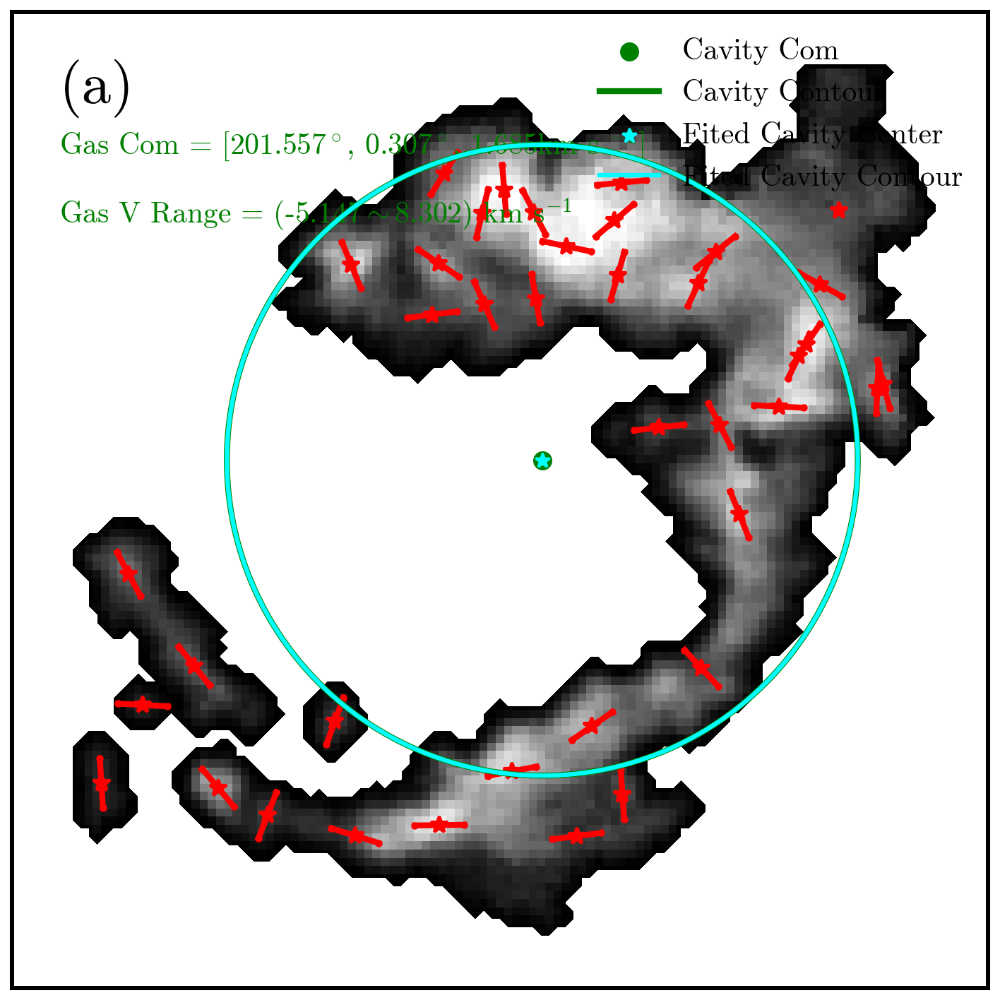

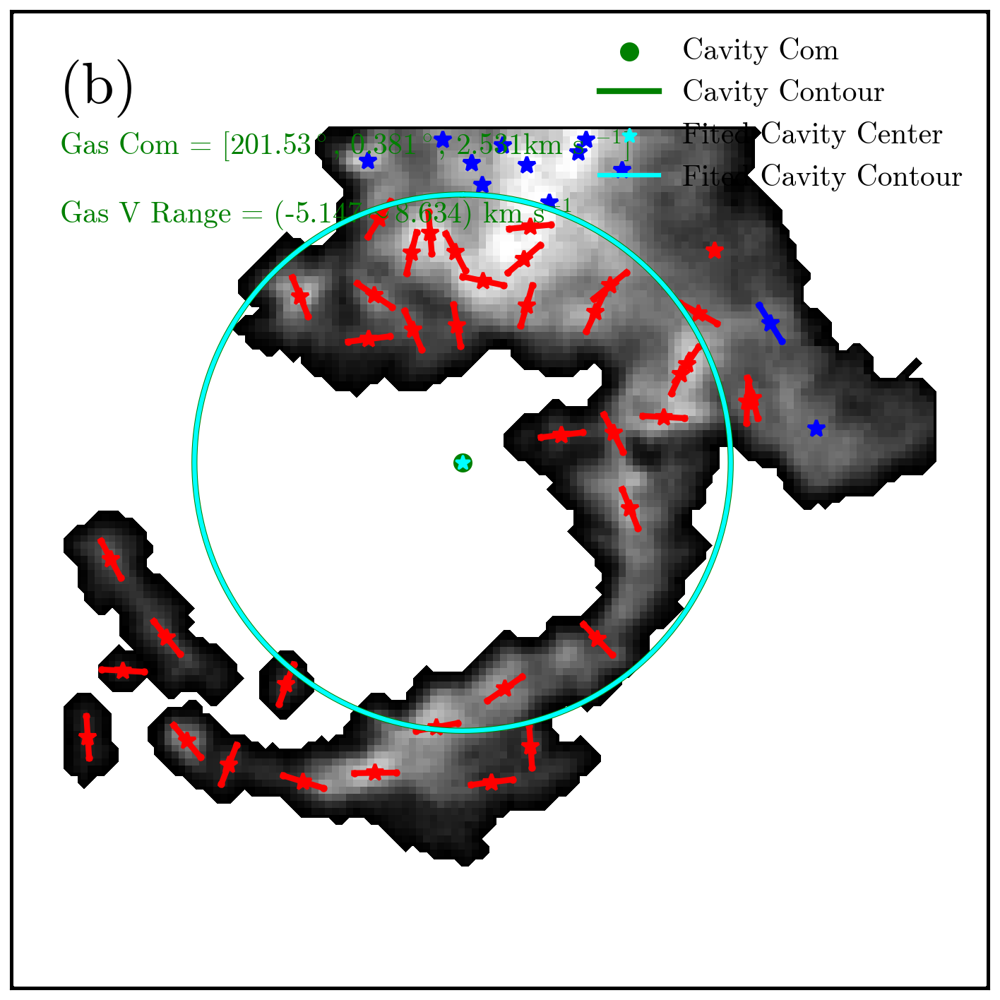

In [114]:
# The following code generates a plot showing the gas region and can also highlight specific bubble contours.

# Plot the gas region associated with the bubble (add_con=False)
ax0 = BFPl.Plot_Bubble_Gas_Region(
    bubbleObj, add_con=False, cmap='gray', plot_clump=True, plot_contour=False, text_num=False, text_com=True,
    tick_logic=False, cbar_logic=False
)

# Plot the an example clump contour
# _, _, _, contour_i, _ = BFM.Cal_2D_Region_From_3D_Coords(clump_coords_dict[156],cal_contours=True)
# ax0.plot(contour_i[:,1]-bubbleObj.start_coords_gas_item_1[2],contour_i[:,0]-bubbleObj.start_coords_gas_item_1[1],\
#          alpha=1,color='gold',linewidth=2,label='Clump Contour')
plt.legend(fontsize=12-2,loc='upper right')

ax0.text(0.05, 0.95, '(a)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
# Annotates the plot with the label '(a)' at the top-left corner

save_path = '../Images/Imgs_Mor/Gas_Region_1_{}.pdf'.format(img_name)
# If save_path is provided, save the gas region plot as a PDF file
if save_path is not None:
    plt.savefig(save_path, format='pdf', dpi=500)
plt.show()  # Display the plot

# Plot another version of the gas region with connected clumps (add_con=True)
ax0 = BFPl.Plot_Bubble_Gas_Region(
    bubbleObj, add_con=True, cmap='gray', plot_clump=True, text_num=False, text_com=True,
    tick_logic=False, cbar_logic=False
)
ax0.text(0.05, 0.95, '(b)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

save_path = '../Images/Imgs_Mor/Gas_Region_2_{}.pdf'.format(img_name)
# If save_path is provided, save the plot as a PDF file
# if save_path is not None:
#     plt.savefig(save_path, format='pdf', dpi=500)
plt.show() 

Using `clump_ids_sub` to automatically estimate the initial values of `bubble_com_pi` and `bubble_radius_p`, followed by iterative adjustment based on images.

In [117]:
print(bubbleObj.start_coords + bubbleObj.bubble_com_item)
print(bubbleObj.bubble_radius_pi)

[70.14658974 72.84564103 77.14712821]
38.35431339408416


In [251]:
# Initialize bubble information (can be provided for further analysis)
bubble_clump_ids_p = clump_ids_sub  # Clump IDs for bubble
bubble_com_pi = np.array([70, 65, 65])  # Placeholder for bubble center information (pixels)
bubble_com_wcs_pi = None  # Placeholder for bubble center information (WCS)
bubble_radius_p = 35  # Placeholder for bubble radius
bubble_infor_provided = [bubble_clump_ids_p, bubble_com_pi, bubble_com_wcs_pi, bubble_radius_p]
# bubble_infor_provided = None  # No initial bubble information provided

# Set parameters for bubble morphology analysis
index = 0  # Set the bubble index to analyze (start for 0)
add_con = False  # Do not include connected gas clumps (blue clumps)
fixed_ec = True  # Keep fitted ellipse center fixed
half_ecoords = True  # Use half ellipse coordinates for the bubble analysis
systemic_v_type = 1  # Set the systemic velocity type for the bubble (see Get_Bubble_Gas_Infor)
ellipse_start_type = 'max' #Reorder ellipse contour coordinates (see Resort_Ellipse_Coords)

# Analyze bubble morphology and store results in dictionary_cuts
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords, ellipse_start_type=ellipse_start_type
)

# Extract bubble data for further analysis
# bubble_inner_data_item = bubbleObj.bubble_inner_data_item  # Inner bubble data
# bubble_inner_region_item = bubbleObj.bubble_inner_region_item  # Inner region data
# start_coords_inner = bubbleObj.start_coords_inner  # Starting coordinates for inner data
bubble_clump_ids = bubbleObj.bubble_clump_ids  # IDs of detected bubble clumps
bubble_clump_ids_con = bubbleObj.bubble_clump_ids_con  # Connected clump IDs

# Extract bubble coordinates and other data
bubble_coords = bubbleObj.bubble_coords  # Coordinates of the bubble cavity
bubble_com_item = bubbleObj.bubble_com_item  # Center of mass (item coordinates)
bubble_com_item_wcs = bubbleObj.bubble_com_item_wcs  # Center of mass (WCS coordinates)
bubble_item = bubbleObj.bubble_item  # Bubble data item
data_wcs_item = bubbleObj.data_wcs_item  # WCS data item
regions_data_i = bubbleObj.regions_data_i  # Regions data for the bubble
start_coords_item = bubbleObj.start_coords  # Starting coordinates for the bubble

# Extract additional information about the bubble's structure
bubble_item_mask_2D = bubbleObj.bubble_item_mask_2D  # 2D mask for the cavity
bubble_contour = bubbleObj.bubble_contour  # Contour of the cavity
ellipse_infor = bubbleObj.ellipse_infor  # Ellipse information for the cavity
ellipse_coords = bubbleObj.ellipse_coords  # Coordinates for the cavity's ellipse


Plot the bubble gas region, which provides insight into the distribution of gas around the bubble.

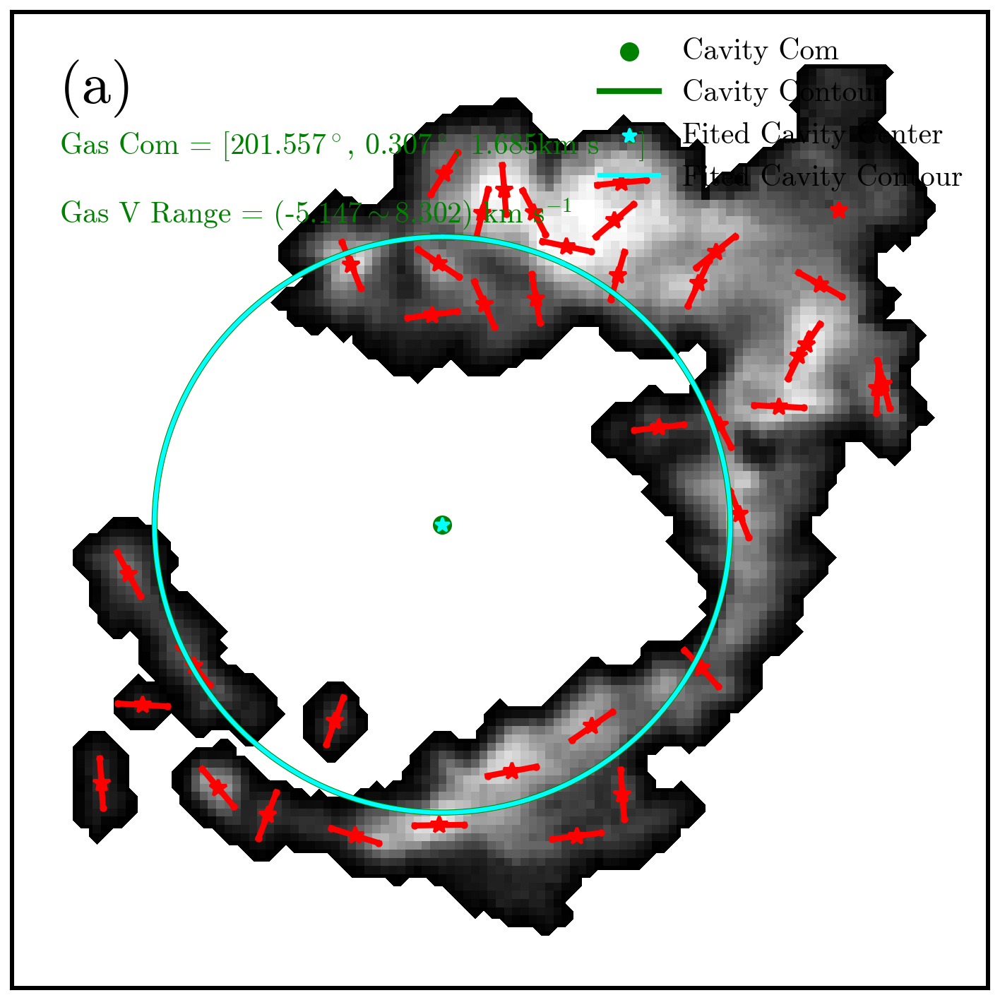

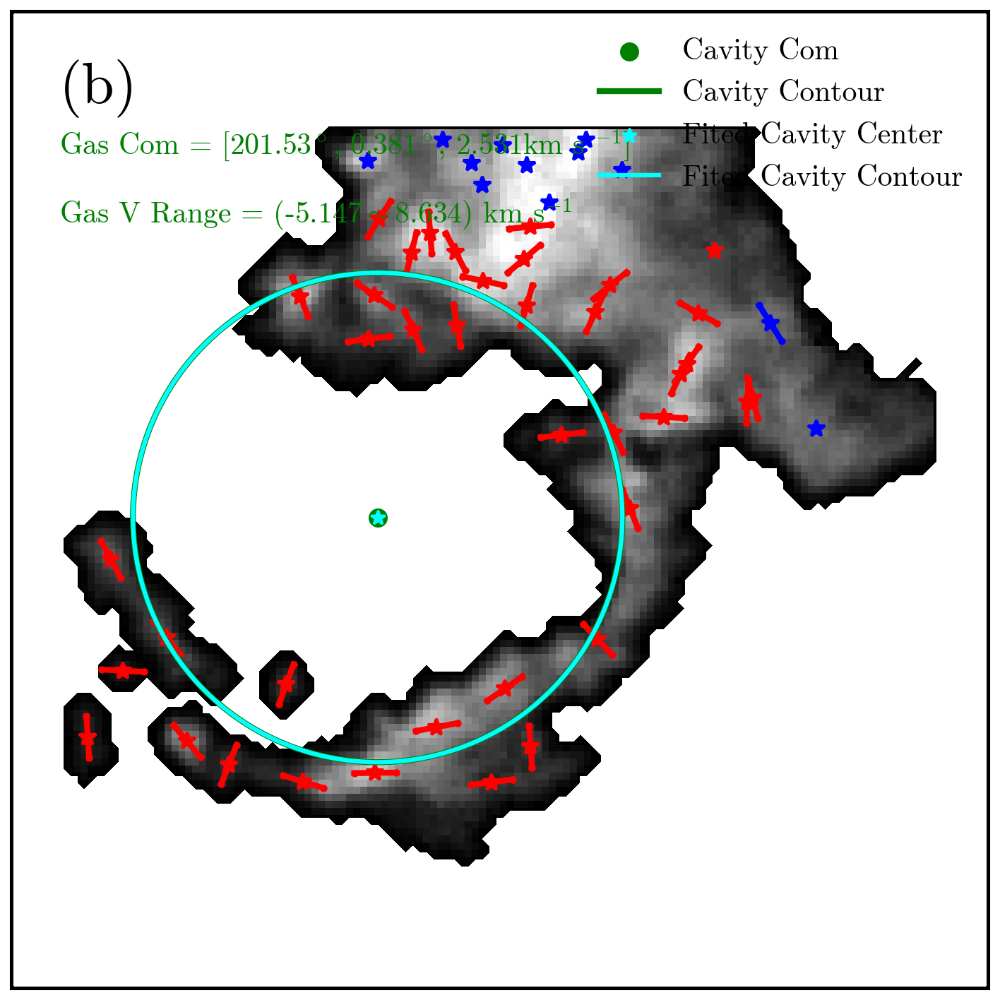

In [256]:
# The following code generates a plot showing the gas region and can also highlight specific bubble contours.

# Plot the gas region associated with the bubble (add_con=False)
ax0 = BFPl.Plot_Bubble_Gas_Region(
    bubbleObj, add_con=False, cmap='gray', plot_clump=True, plot_contour=False, text_num=False, text_com=True,
    tick_logic=False, cbar_logic=False
)

# Plot the an example clump contour
# _, _, _, contour_i, _ = BFM.Cal_2D_Region_From_3D_Coords(clump_coords_dict[156],cal_contours=True)
# ax0.plot(contour_i[:,1]-bubbleObj.start_coords_gas_item_1[2],contour_i[:,0]-bubbleObj.start_coords_gas_item_1[1],\
#          alpha=1,color='gold',linewidth=2,label='Clump Contour')
plt.legend(fontsize=12-2,loc='upper right')

ax0.text(0.05, 0.95, '(a)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
# Annotates the plot with the label '(a)' at the top-left corner

save_path = '../Images/Imgs_Mor/Gas_Region_1_{}.pdf'.format(img_name)
# If save_path is provided, save the gas region plot as a PDF file
if save_path is not None:
    plt.savefig(save_path, format='pdf', dpi=500)
plt.show()  # Display the plot

# Plot another version of the gas region with connected clumps (add_con=True)
ax0 = BFPl.Plot_Bubble_Gas_Region(
    bubbleObj, add_con=True, cmap='gray', plot_clump=True, text_num=False, text_com=True,
    tick_logic=False, cbar_logic=False
)
ax0.text(0.05, 0.95, '(b)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

save_path = '../Images/Imgs_Mor/Gas_Region_2_{}.pdf'.format(img_name)
# If save_path is provided, save the plot as a PDF file
# if save_path is not None:
#     plt.savefig(save_path, format='pdf', dpi=500)
plt.show() 

Plot the velocity channel maps of the bubble

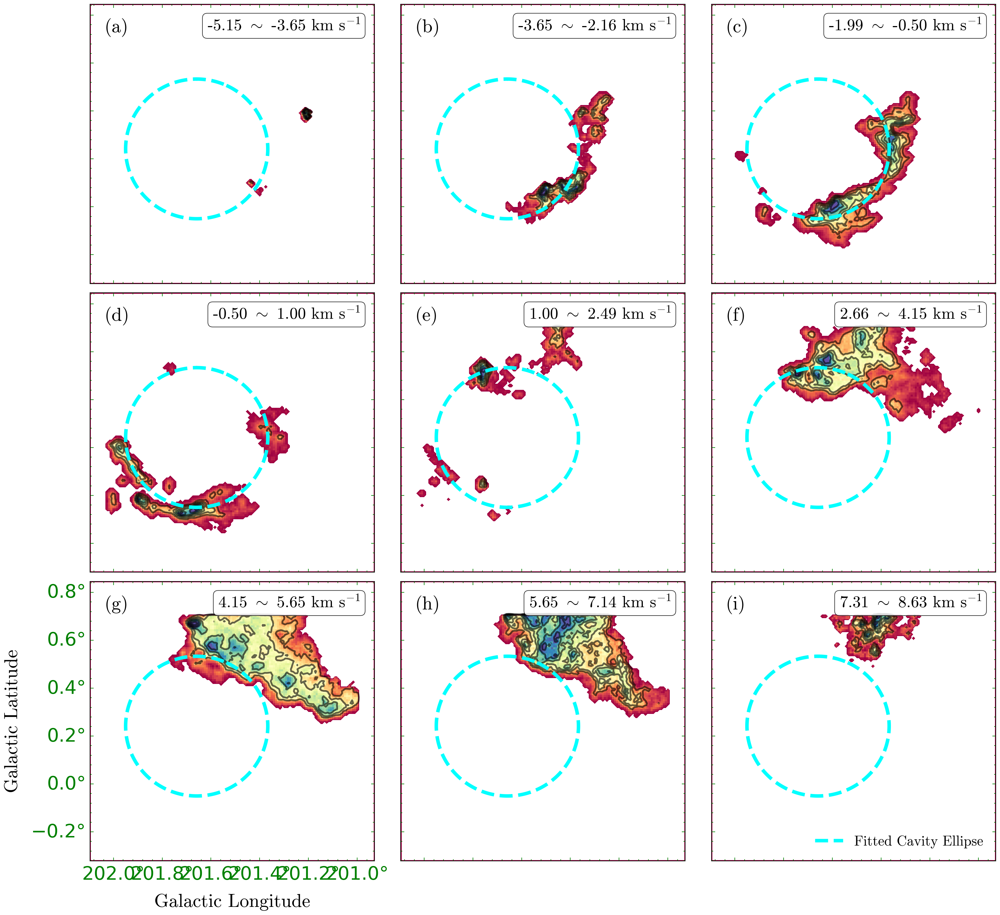

In [261]:
# The next section involves plotting the velocity channel maps, which are useful for studying the bubble's structure
# across different velocity slices. This gives a more detailed view of the velocity distribution.

# Generate velocity channel maps for the bubble
axes = BFPl.Plot_Velocity_Channel_Maps(
    bubbleObj,gas_type=2,velocity_range=None,n_slices=9,integration_width=None,figsize=(12, 11),
    cmap='Spectral',vmin=None,vmax=None,v_label_position='top_right',percentile_value=10,fontsize=16,linewidth=3,add_contours=True,
    contour_levels=None,contour_colors='black',contour_linewidths=1.5,contour_alpha=0.6,show_ellipse=True,
    ellipse_color='cyan',ellipse_linestyle='--',show_legend=True,cbar_logic=False)

# The Plot_Velocity_Channel_Maps function generates the velocity channel maps with various customization options
# such as contour levels, color maps, and ellipse overlays to highlight the bubble's structure

save_path = '../Images/Imgs_Mor/Velocity_Channel_Maps_{}.pdf'.format(img_name)
# If save_path is provided, save the velocity channel maps plot as a PDF file
if save_path is not None:
    plt.savefig(save_path, format='pdf', dpi=500)
plt.show() 

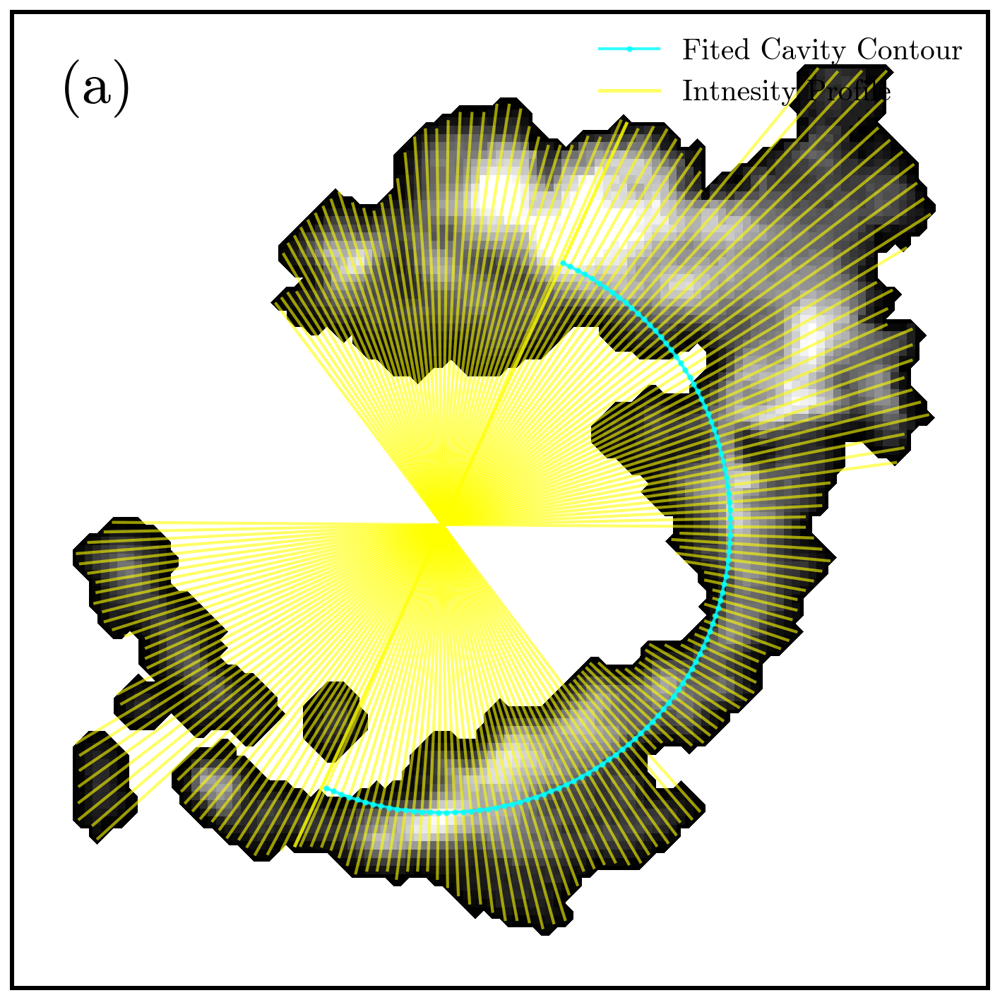

In [264]:
# Set parameters for bubble morphology analysis
add_con = False 
fixed_ec = True 
half_ecoords = True  # Use half ellipse coordinates for the bubble analysis

# Analyze the bubble morphology and store data in dictionary_cuts
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords
)

# Set the line index for plotting a specific region of the bubble
line_index = 0

# Plot the bubble item with specified settings
ax0 = BFPl.Plot_Bubble_Item(
    bubbleObj, line_index=line_index, line_logics=[True,False],tick_logic=False, 
    label_l='Intnesity Profile',label_e='Cavity Contour', 
    figsize=(8, 6), fontsize=12, spacing=12*u.arcmin
)

# Annotate the plot with the label '(c)'
ax0.text(0.05, 0.95, '(a)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

# Save or display the plot
save_path = '../Images/Imgs_Mor/Region_Slice_{}_Cavity.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=500)

plt.show() 

profile_IOU: 0.56


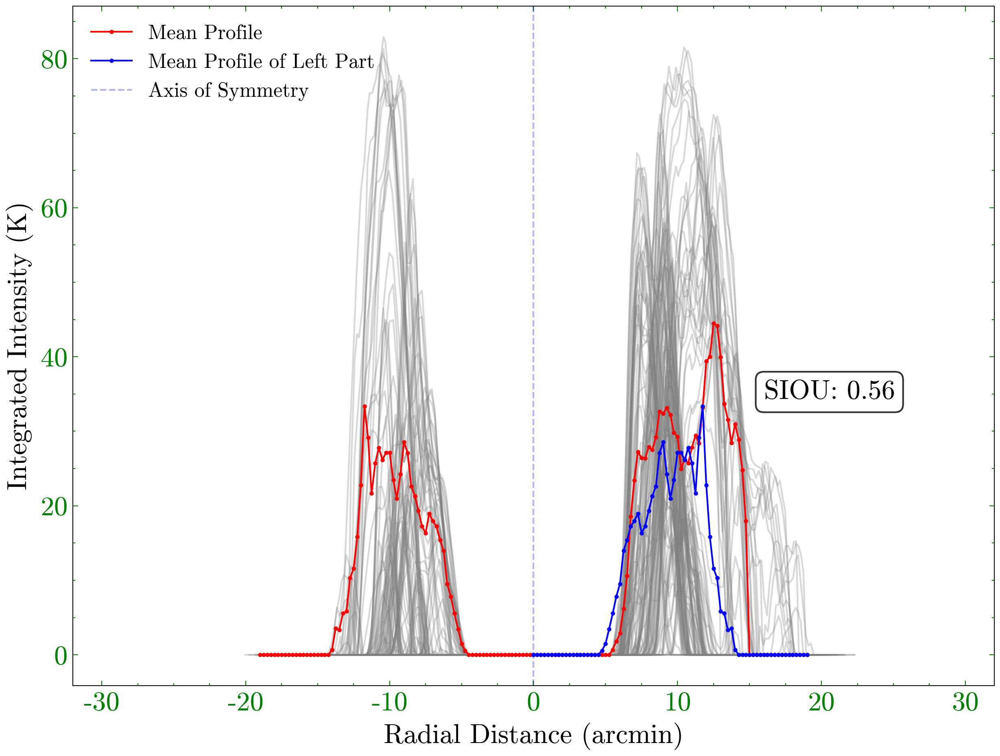

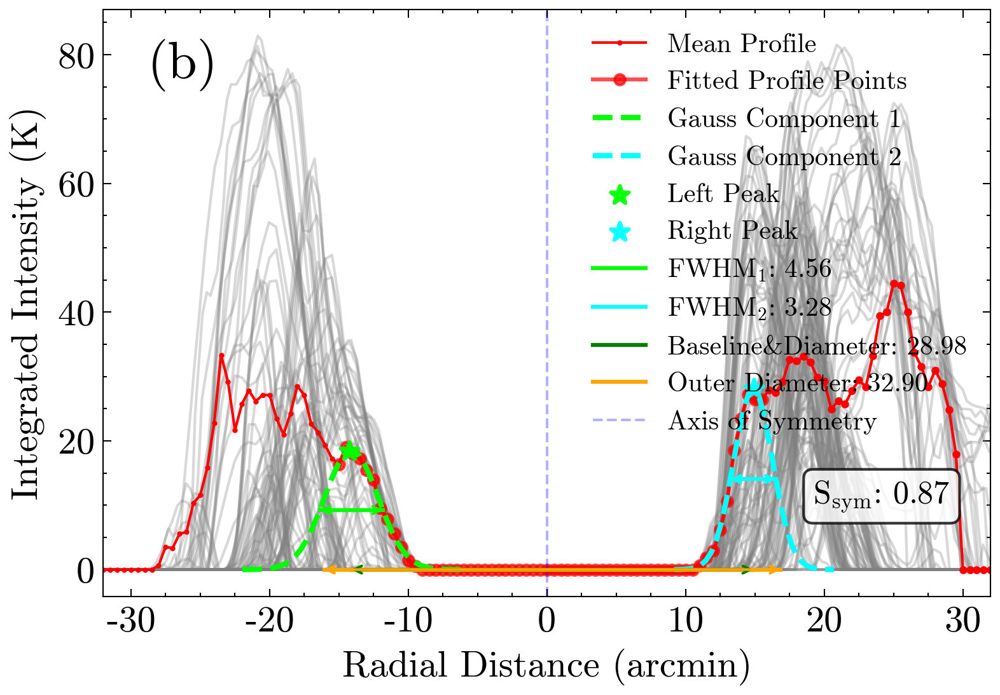

In [267]:
# Set parameters for bubble morphology analysis
add_con = False  
fixed_ec = True  
half_ecoords = True 

# Analyze the bubble morphology and store data in dictionary_cuts
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords
)

# Perform velocity and spatial profile analysis for the bubble
MeanProfile = True  # Enable mean profile calculation

# Calculate the mean velocity profile for the bubble within the range [-30, 30] km/s
BFPr.Cal_Mean_Profile(bubbleObj, mean_line_num=2, mean_line_range=[-30, 30], ExtendRange=0)

# Calculate intensity profile using the method Cal_Profile_IOU
Profile_Funs.Cal_Profile_IOU(bubbleObj, MeanProfile)

# Print the intensity profile IOU
print('profile_IOU:', bubbleObj.profile_IOU) 

# Plot the velocity profile of the bubble
ax0 = BFPl.Plot_Profile(bubbleObj)

# Fit a double Gaussian to the bubble's intensity profile with width constraints
fit_results = BFPr.Fit_Double_Gaussian(bubbleObj, local_fit=True, left_constraint_width=6, right_constraint_width=6)

# Calculate the Full Width at Half Maximum (FWHM) for the bubble's intensity profile
bubble_params_RFWHM = BFPr.Cal_Bubble_RFWHM(bubbleObj, ref_ellipse='cavity', SymScore=0.8)

# Plot the fitted intensity profile
ax0 = BFPl.Plot_Profile_Fit(bubbleObj, figsize=(6, 4))

ax0.text(0.05, 0.95, '(b)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

# Uncomment to save the plot
save_path = '../Images/Imgs_IP/Intensity_Profiles_{}_Cavity.pdf'.format(img_name)
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=1000)

plt.show()  

In [269]:
bubbleObj.angle_offset

285.592904617257

In [409]:
def Unwrap_Ellipse_Data(data, center_x, center_y, semi_major, semi_minor, theta,
                        width, angle_offset=0):
    """
    Unwrap a 2D image in an elliptical coordinate system around a given ellipse.

    Concept:
      - Parameterize the ellipse by angle t in [0, 2π),
      - At each t, compute the outward normal direction,
      - Sample data along normal offsets in [-width, +width] using bilinear interpolation,
      - Output is an "unwrapped" image (normal_offset x angle_position).

    Parameters
    ----------
    data : 2D ndarray
        Original 2D image (e.g., bubble_item.sum(0)).
    center_x, center_y : float
        Ellipse center (in image x/y coordinates).
    semi_major, semi_minor : float
        Ellipse semi-axes (a, b).
    theta : float
        Ellipse rotation angle in radians.
    width : float
        Half-width for sampling along the normal direction.
    angle_offset : float
        Starting angle shift in degrees (sets where unwrapped angle=0 begins).

    Returns
    -------
    unwrapped : 2D ndarray
        Unwrapped image of shape [n_normal, n_angles] after transpose (see code).
    arc_lengths : 1D ndarray
        Normalized arc-length position (0..1) along the ellipse.
    normal_dist : 1D ndarray
        Normal offsets sampled in [-width, +width].
    """
    # Ellipse perimeter approximation using complete elliptic integral
    e_squared = 1 - (semi_minor ** 2 / semi_major ** 2)
    E = ellipe(e_squared)
    perimeter = 4 * semi_major * E

    # Sampling counts: one sample per pixel along perimeter; normal samples per unit width
    n_angles = int(round(perimeter))
    n_normal = int(width * 2 + 1)

    # Parametric angles with starting offset
    t_angles = np.linspace(0, 2 * np.pi, n_angles, endpoint=False) + np.radians(angle_offset)
    normal_dist = np.linspace(-width, width, n_normal)

    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)

    unwrapped = np.zeros((n_angles, n_normal))
    arc_lengths = np.zeros(n_angles)
    # plt.imshow(data)
    # plt.show()

    for i, t in enumerate(t_angles):
        # Ellipse point in local coordinates
        x_local = semi_major * np.cos(t)
        y_local = semi_minor * np.sin(t)

        # Tangent vector in local coordinates
        dx_local = -semi_major * np.sin(t)
        dy_local = semi_minor * np.cos(t)

        # Rotate tangent into global coordinates
        dx_global = cos_theta * dx_local - sin_theta * dy_local
        dy_global = sin_theta * dx_local + cos_theta * dy_local

        # Unit normal vector perpendicular to tangent
        tangent_length = np.sqrt(dx_global ** 2 + dy_global ** 2)
        nx = -dy_global / tangent_length
        ny = dx_global / tangent_length

        # Ellipse point in global image coordinates
        x_ellipse = center_x + cos_theta * x_local - sin_theta * y_local
        y_ellipse = center_y + sin_theta * x_local + cos_theta * y_local

        # Approximate arc-length progression
        if i > 0:
            arc_lengths[i] = arc_lengths[i - 1] + tangent_length * (2 * np.pi / n_angles)

        # Sample along the normal direction using bilinear interpolation
        for j, n_offset in enumerate(normal_dist):
            x = x_ellipse + n_offset * nx
            y = y_ellipse + n_offset * ny

            if 0 <= x < data.shape[1] - 1 and 0 <= y < data.shape[0] - 1:
                x0, y0 = int(x), int(y)
                x1, y1 = x0 + 1, y0 + 1
                wx, wy = x - x0, y - y0

                value = ((1 - wx) * (1 - wy) * data[y0, x0] +
                         wx * (1 - wy) * data[y0, x1] +
                         (1 - wx) * wy * data[y1, x0] +
                         wx * wy * data[y1, x1])

                unwrapped[i, j] = value
                # plt.imshow(data)
                # plt.plot(x0,y0, 'r*')
                # plt.plot(x1,y0, 'g*')
                # plt.plot(x0,y1, 'b*')
                # plt.show()
                # plt.imshow(unwrapped.T)
                # plt.show()

    # Normalize arc-length to [0,1]
    if arc_lengths[-1] > 0:
        arc_lengths = arc_lengths / arc_lengths[-1]

    # Transpose to shape [normal, angle] (matches later usage)
    unwrapped = unwrapped.T

    # If width exceeds semi_minor, remove invalid inner rows (heuristic masking)
    if width > semi_minor:
        delta_width = int(round(width - semi_minor)) + 1
        unwrapped[:delta_width] = 0

    return unwrapped, arc_lengths, normal_dist



def Get_Bubble_Skeleton_Weighted(bubbleObj, unwrap_radius=None, unwrap_width=None, angle_offset=None,
                                 bubble_radius_min=4, ra_min = 2, unwrapped_zero_col=11, unwrap_value='max', trim_logic=True):
    """
    High-level pipeline: compute bubble skeleton by unwrapping the bubble onto an ellipse.

    Steps:
      1) Determine ellipse parameters (from bubbleObj.ellipse_infor or fallback to circle),
      2) Choose a stable starting angle (align to max/min intensity on ellipse boundary),
      3) Unwrap bubble 2D projection into (normal_offset x arc_position) image,
      4) Find skeleton in unwrapped domain via MST + max-weight path,
      5) Map skeleton back to original image coordinates,
      6) Fit an ellipse to the mapped skeleton curve,
      7) Store all derived products into bubbleObj.

    Parameters
    ----------
    bubbleObj : object
        Should contain bubble_item, bubble_com_item, bubble_params_RFWHM, start_coords, etc.
    unwrap_radius : float or None
        If provided, forces circle radius for unwrapping.
    unwrap_width : int or None
        Half-width in pixels for normal sampling during unwrapping.
    angle_offset : float or None
        Starting angle in degrees for unwrapping.
    bubble_radius_min : int
        The minimum value for bubble radius
    unwrapped_zero_col : int
        Used to zero out a fraction of radial rows near the top/bottom of unwrapped image.
    unwrap_value : {'max','min'}
        Choose starting angle by brightest/dimmest boundary point.
    trim_logic : bool
        Whether to trim the unwrapped skeleton path.

    Side Effects
    ------------
    Writes many attributes back into bubbleObj (unwrapped data, skeleton coords, fitted ellipse, etc.).
    """
    bubble_item = bubbleObj.bubble_item
    bubble_com_item = bubbleObj.bubble_com_item
    bubble_radius = bubbleObj.bubble_params_RFWHM['radius']
    bubble_thickness = bubbleObj.bubble_params_RFWHM['thickness']
    skeleton_coords_unwrapped = np.array([[0, 0]])

    # Determine ellipse parameters for unwrapping
    if unwrap_radius is not None:
        semi_major = unwrap_radius
        semi_minor = unwrap_radius
        ellipse_angle_rad = 0
    elif hasattr(bubbleObj, 'ellipse_infor'):
        ellipse_x00, ellipse_y00, ellipse_angle, semi_major_0, semi_minor_0 = bubbleObj.ellipse_infor
        semi_major = np.max([bubble_radius,bubble_radius_min])
        semi_minor = np.max([bubble_radius,bubble_radius_min]) * np.abs(semi_minor_0 / semi_major_0)
        if ellipse_angle == 0:
            ellipse_angle_rad = 0
        else:
            ellipse_angle_rad = np.radians(90 - ellipse_angle)
    else:
        semi_major = np.max([bubble_radius,bubble_radius_min])
        semi_minor = np.max([bubble_radius,bubble_radius_min])
        ellipse_angle_rad = 0

    # Unwrapping center in image coords (x=l, y=b ordering is assumed here)
    ellipse_x0, ellipse_y0 = bubble_com_item[2], bubble_com_item[1]

    # Choose angle_offset by locating the max/min value on ellipse boundary
    unwrap_ellipse_points, point_mvalue, delta_angle = Cal_Angle_Between_Com_And_MaxValue(
        bubble_item, bubble_com_item, semi_major, semi_minor, ellipse_angle_rad, unwrap_value
    )

    if unwrap_radius is None:
        unwrap_radius = bubble_radius
    if unwrap_width is None:
        unwrap_width = int(round(bubble_thickness / 2))
    if angle_offset is None:
        angle_offset = delta_angle

    # print('angle_offset:',angle_offset,ellipse_angle_rad)
    
    # Unwrap the 2D projection (sum over v-axis)
    unwrapped_bub_data, arc_lengths, normal_distances = Unwrap_Ellipse_Data(
        bubble_item.sum(0), ellipse_x0, ellipse_y0, semi_major, semi_minor,
        ellipse_angle_rad, unwrap_width, angle_offset)
    
    # plt.imshow(unwrapped_bub_data)
    # plt.show()

    # Mask out a band near top/bottom radial boundaries (heuristic cleanup)
    unwrapped_bub_data_shape = unwrapped_bub_data.shape
    zero_width = np.max([np.int16(np.around(unwrapped_bub_data_shape[0] / unwrapped_zero_col)),1])
    unwrapped_bub_data_T = unwrapped_bub_data.copy()
    unwrapped_bub_data_T[:zero_width, :] = 0
    unwrapped_bub_data_T[unwrapped_bub_data_shape[0] - zero_width:, :] = 0
    
    # Build connected components on the remaining unwrapped mask
    bub_mask = unwrapped_bub_data_T > 0
    bub_mask_label = measure.label(bub_mask, connectivity=2)
    regions_list = measure.regionprops(bub_mask_label)

    # For each connected region that crosses the midline (unwrap_width), compute skeleton
    for i in range(len(regions_list)):
        mask_coords = regions_list[i].coords
        if unwrap_width in mask_coords[:, 0] and len(mask_coords) > 2*unwrap_width:
            Graph_find_skeleton, Tree = Graph_Infor_Connected_Unwrapped_Bub(unwrapped_bub_data, mask_coords)
            splice_nodes_pair = Get_Splice_Nodes_Pair(unwrapped_bub_data, mask_coords, Tree)
            skeleton_coords_unwrapped_i = Get_Bubble_Skeleton_Weighted_Unwrapped(
                unwrapped_bub_data, Tree, splice_nodes_pair, mask_coords, trim_logic)

            skeleton_coords_unwrapped_i, skeleton_radial, skeleton_angles = Get_Mapping_Skeleton_Coords(
                skeleton_coords_unwrapped_i, unwrap_width)
            
            skeleton_coords_unwrapped = np.r_[skeleton_coords_unwrapped, skeleton_coords_unwrapped_i]
            
    skeleton_coords_unwrapped = skeleton_coords_unwrapped[1:]
    
    # Convert skeleton coordinates to (normal_offset, arc_position) in [0,1]
    skeleton_normal = skeleton_coords_unwrapped[:, 0] - unwrap_width
    skeleton_arc = skeleton_coords_unwrapped[:, 1] / skeleton_coords_unwrapped[:, 1].max()

    # Map skeleton back to original image coordinates
    skeleton_x, skeleton_y = Map_Curve_From_Unwrapped_Ellipse(
        skeleton_normal, skeleton_arc, ellipse_x0, ellipse_y0,
        semi_major, semi_minor, ellipse_angle_rad, angle_offset
    )
    skeleton_coords_original = np.c_[skeleton_y, skeleton_x]

    # Fit an ellipse to the mapped skeleton curve (algebraic fit)
    # paras = BFM.Solve_Ellipse(skeleton_coords_original[:, 0], skeleton_coords_original[:, 1])
    # skeleton_ellipse_infor, coords_fit, ellipse_perimeter = BFM.Solve_Ellipse_Infor(paras)
    # skeleton_coords_ellipse = np.c_[coords_fit[0], coords_fit[1]]
    skeleton_ellipse_infor, skeleton_coords_ellipse = BFM.Fit_Ellipse_Geometric(skeleton_coords_original, center=None)

    # Convert back to global coordinates by adding the bubble item start offset
    start_coords_item = bubbleObj.start_coords
    skeleton_ellipse_infor[0] = skeleton_ellipse_infor[0] + start_coords_item[1]
    skeleton_ellipse_infor[1] = skeleton_ellipse_infor[1] + start_coords_item[2]
    skeleton_coords_original = np.c_[skeleton_y, skeleton_x] + start_coords_item[1:]
    skeleton_coords_ellipse = skeleton_coords_ellipse + start_coords_item[1:]

    if skeleton_ellipse_infor[4] < ra_min:
        skeleton_ellipse_infor = bubbleObj.ellipse_infor_cav
        skeleton_coords_ellipse = bubbleObj.ellipse_coords_cav

    # Store all products into bubbleObj
    bubbleObj.unwrap_semi_major = semi_major
    bubbleObj.unwrap_semi_minor = semi_minor
    bubbleObj.unwrap_ellipse_points = unwrap_ellipse_points
    bubbleObj.point_mvalue = point_mvalue
    bubbleObj.unwrap_radius = unwrap_radius
    bubbleObj.unwrap_width = unwrap_width
    bubbleObj.angle_offset = angle_offset
    bubbleObj.unwrapped_bub_data = unwrapped_bub_data
    bubbleObj.skeleton_coords_unwrapped = skeleton_coords_unwrapped
    bubbleObj.skeleton_coords_original = skeleton_coords_original
    bubbleObj.skeleton_ellipse_infor = skeleton_ellipse_infor
    bubbleObj.skeleton_coords_ellipse = skeleton_coords_ellipse

    BFM.Resort_Ellipse_Coords(bubbleObj,add_con=bubbleObj.add_con,scoords_logic=True)


BFS.Get_Bubble_Skeleton_Weighted = Get_Bubble_Skeleton_Weighted

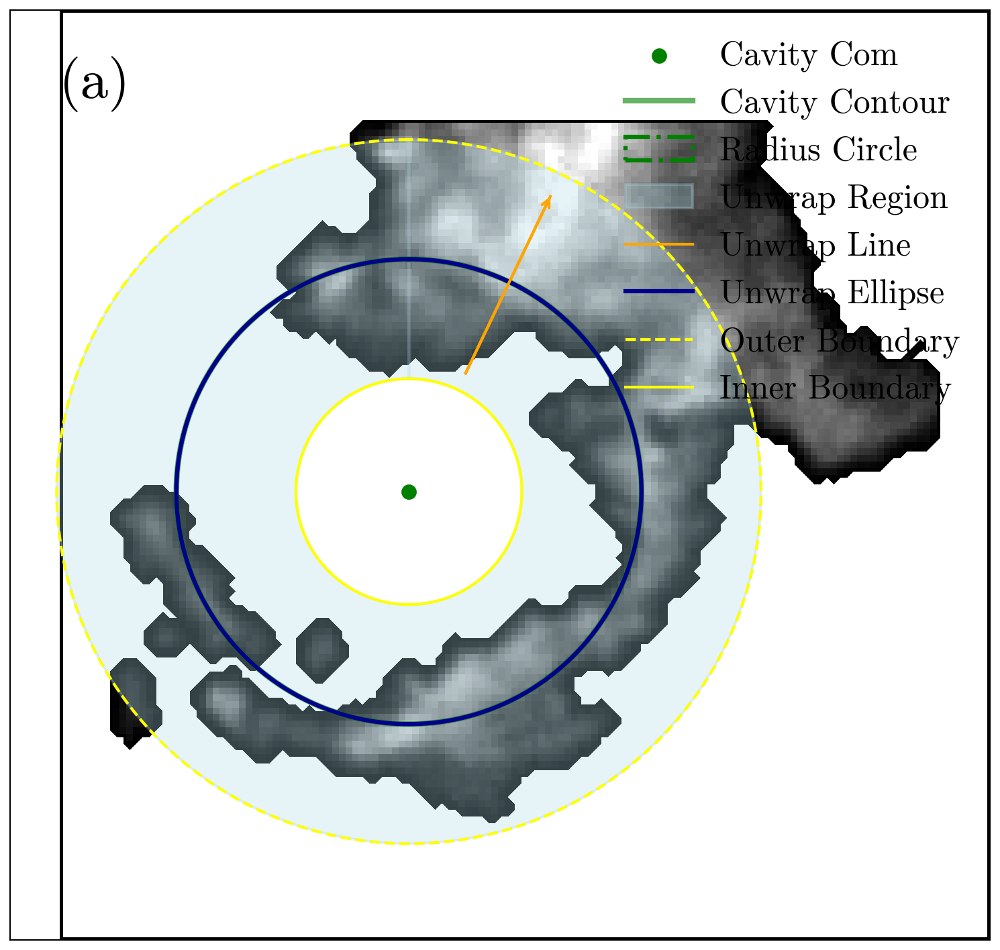

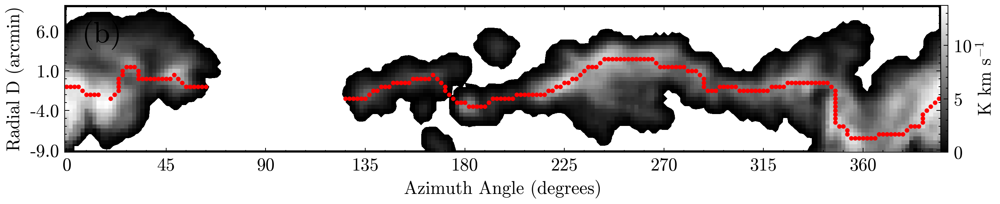

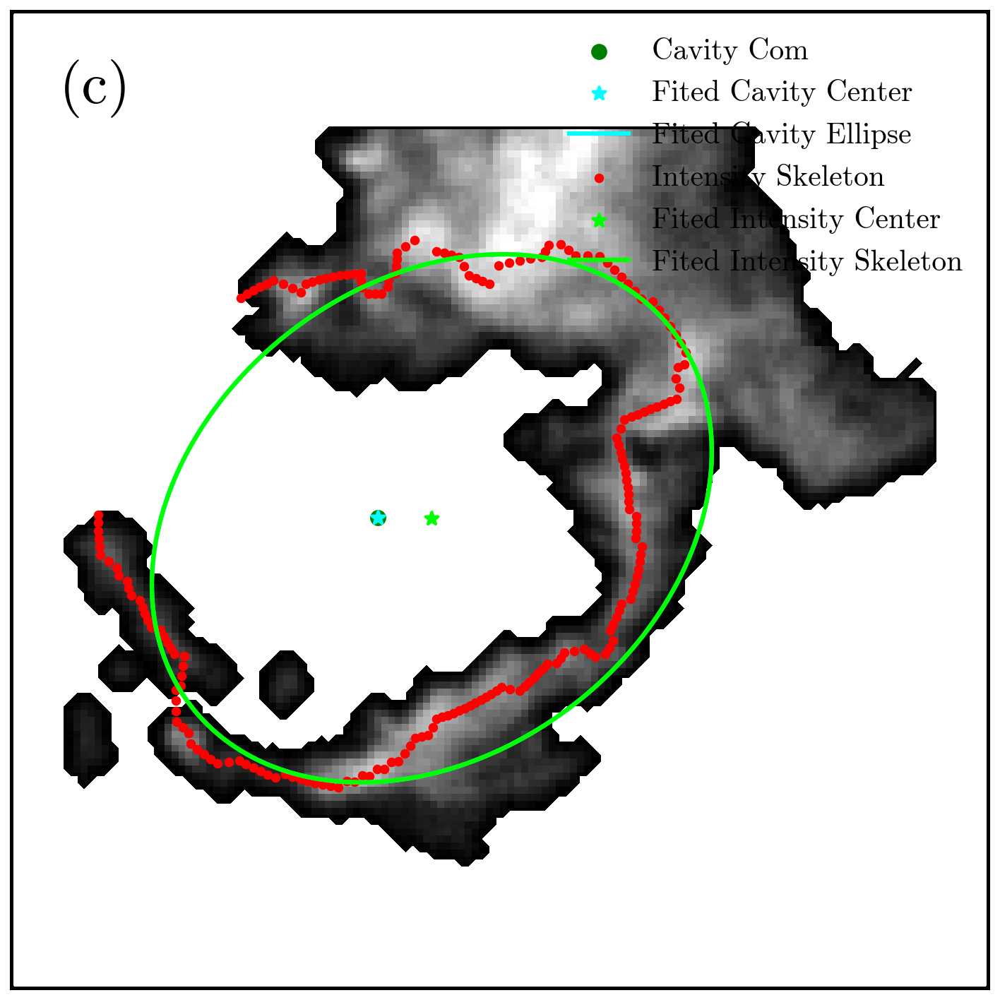

In [413]:
# Set parameters for unwrapping the bubble skeleton
add_con = True  
unwrap_radius = None # No specific radius for unwrapping (default: bubble radius)
unwrap_width = None  # No specific width for unwrapping (default: bubble thickness)
angle_offset = None  # No angle offset for unwrapping (default: max intensity on the inner ellipse coordinates.)

# Get the weighted bubble skeleton data
BFS.Get_Bubble_Skeleton_Weighted(
    bubbleObj, unwrap_radius=unwrap_radius, unwrap_width=unwrap_width, angle_offset=angle_offset, unwrap_value='max',trim_logic=True
)
# This function processes the bubble's skeleton and adjusts for radius, width, and angle offset
# It returns a weighted skeleton, which is important for understanding the bubble's structure.

# Plot the unwrapped bubble skeleton information
ax0 = BFPl.Plot_Unwrap_Bubble_Infor(
    bubbleObj,add_con,plot_clump=False,plot_ellipse=False,plot_contour=True,\
    plot_circles=[True,False],plot_annotate=False,plot_skeleton=False,plot_skeleton_ellipse=False,\
    tick_logic=False,cbar_logic=False,skeleton_types=['scatter','line'],linewidth=1.5,figsize=(8,6),fontsize=12
)
# Visualizes the unwrapped bubble skeleton, showing it as a scatter or line plot with optional contours and circles.

# Add an ellipse around the skeleton to highlight the bubble's shape
ellipse_x0, ellipse_y0, ellipse_angle, semi_major_0, semi_minor_0 = bubbleObj.ellipse_infor
ellipse_x0 = ellipse_x0 - bubbleObj.start_coords_gas_item_2[1]
ellipse_y0 = ellipse_y0 - bubbleObj.start_coords_gas_item_2[2]

semi_major = bubbleObj.unwrap_semi_major
semi_minor = bubbleObj.unwrap_semi_minor
ax0 = BFPl.Plot_Ellipse_Width_Region(ax0, ellipse_y0, ellipse_x0, ellipse_angle, semi_major, semi_minor, \
                                     bubbleObj.unwrap_width,bubbleObj.angle_offset)

# Adds an ellipse to represent the overall bubble shape, adjusting for the width and angle.

# Annotate and display the plot
plt.legend(loc='upper right', fontsize=12)  # Add a legend to the plot
ax0.text(0.05, 0.95, '(a)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
# Annotates the plot with the label '(a)'

# Save or display the plot
save_path = '../Images/Imgs_Skt/Unwrap_Range_{}.pdf'.format(img_name)
# If save_path is provided, save the plot as a PDF file
if save_path is not None:
    plt.savefig(save_path, format='pdf', dpi=1000)
plt.show()  


# Plot the unwrapped bubble data to visualize the bubble's structure and its regions
# This section of code visualizes the unwrapped bubble data after the skeleton analysis, providing insight into the regions within the bubble.

# Plot the unwrapped bubble data with detailed settings
ax0 = BFPl.Plot_Unwrapped_Bub_Data(
    bubbleObj, fontsize=12, figsize=(17, 2)
)
# The Plot_Unwrapped_Bub_Data function generates a plot that represents the unwrapped data of the bubble,
# allowing the user to visualize the structure of the bubble in a detailed way, with adjustable font size and figure size.

ax0.text(0.02, 0.9, '(b)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
# Annotates the plot with the label '(b)', positioned in the top-left corner

save_path = '../Images/Imgs_Skt/Unwrap_Data_{}.pdf'.format(img_name)
# If a save path is provided, save the unwrapped bubble data plot as a PDF file
if save_path is not None:
    plt.savefig(save_path, format='pdf', dpi=1000)
plt.show() 


ax0 = BFPl.Plot_Unwrap_Bubble_Infor(bubbleObj,add_con=add_con,plot_clump=False,plot_ellipse=True,plot_contour=False,\
                                    plot_circles=[False,False],plot_annotate=False,plot_skeleton=True,plot_skeleton_ellipse=True,\
                                    tick_logic=False,cbar_logic=False,\
                                    skeleton_types=['scatter','line'],linewidth=1.5,figsize=(8,6),fontsize=12)

ax0.text(0.05, 0.95, '(c)', color='black',transform=ax0.transAxes, verticalalignment='top', fontsize=20)
save_path = '../Images/Imgs_Skt/Fited_Skt_{}.pdf'.format(img_name)
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=1000)
plt.show()

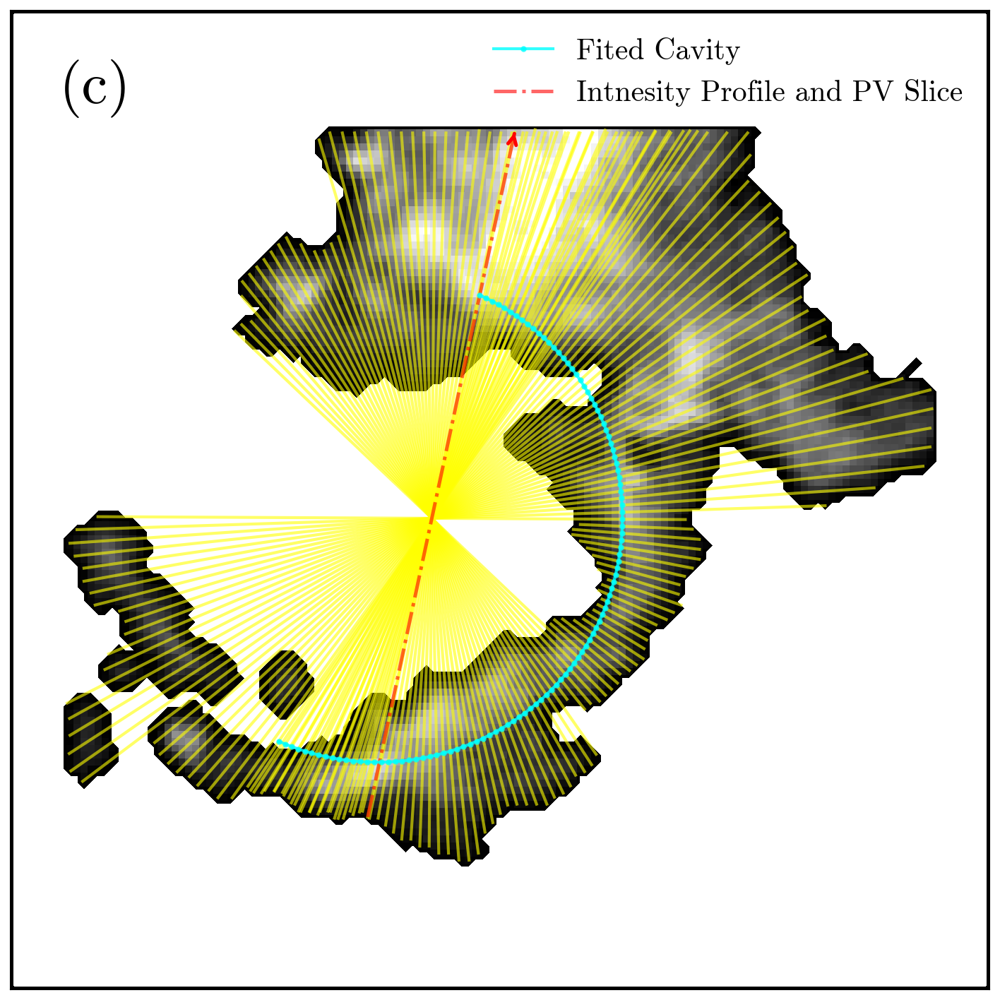

In [415]:
# Set parameters for bubble morphology analysis
add_con = True 
fixed_ec = False 
half_ecoords = True  # Use half ellipse coordinates for the bubble analysis

# Analyze the bubble morphology and store data in dictionary_cuts
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords,
    skeleton_ellipse_infor=bubbleObj.skeleton_ellipse_infor,
    skeleton_coords_ellipse=bubbleObj.skeleton_coords_ellipse
)

# Set the line index for plotting a specific region of the bubble
line_index = 0

# Plot the bubble item with specified settings
ax0 = BFPl.Plot_Bubble_Item(
    bubbleObj, line_index=line_index, line_logics=[True,True],tick_logic=False, 
    label_l='Intnesity Profile and PV Slice',label_e='Cavity', 
    figsize=(8, 6), fontsize=12, spacing=12*u.arcmin
)

# Annotate the plot with the label '(c)'
ax0.text(0.05, 0.95, '(c)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

# Save or display the plot
save_path = '../Images/Imgs_Mor/Region_Slice_{}.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
# if save_path != None:
#     plt.savefig(save_path, format='pdf', dpi=500)

plt.show() 

profile_IOU: 0.8


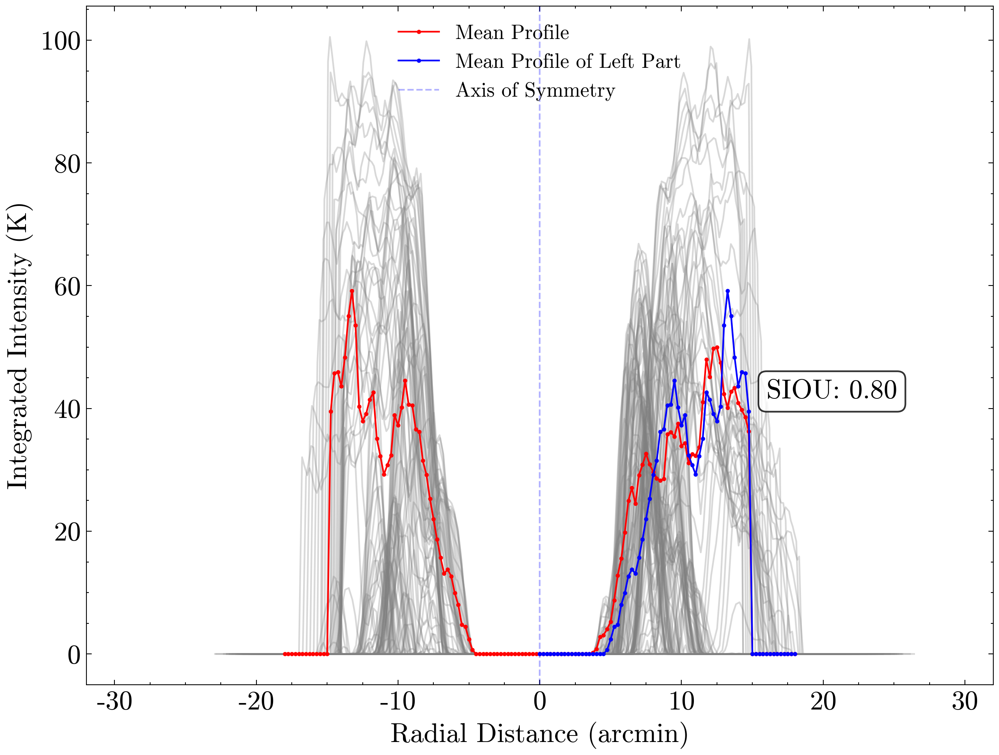

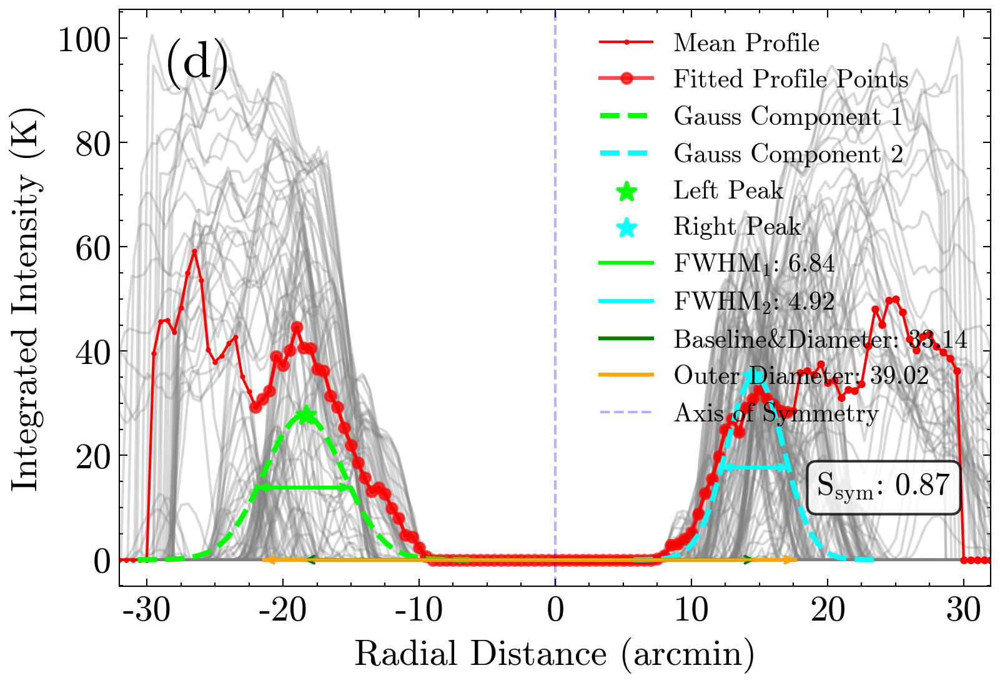

In [417]:
# Set parameters for bubble morphology analysis
add_con = True  
fixed_ec = False  
half_ecoords = True 

# Analyze the bubble morphology and store data in dictionary_cuts
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords,
    skeleton_ellipse_infor=bubbleObj.skeleton_ellipse_infor,
    skeleton_coords_ellipse=bubbleObj.skeleton_coords_ellipse
)

# Perform velocity and spatial profile analysis for the bubble

# Calculate the mean velocity profile for the bubble within the range [-30, 30] km/s
BFPr.Cal_Mean_Profile(bubbleObj, mean_line_num=0, mean_line_range=[-30, 30], ExtendRange=0)

# Calculate intensity profile using the method Cal_Profile_IOU
MeanProfile = True  # Enable mean profile calculation
Profile_Funs.Cal_Profile_IOU(bubbleObj, MeanProfile)

# Print the intensity profile IOU
print('profile_IOU:', bubbleObj.profile_IOU) 

# Plot the velocity profile of the bubble
ax0 = BFPl.Plot_Profile(bubbleObj)


# Fit a double Gaussian to the bubble's intensity profile with width constraints
fit_results = BFPr.Fit_Double_Gaussian(bubbleObj, local_fit=True, ref_ellipse='skeleton', bounds_per=2)

# Calculate the Full Width at Half Maximum (FWHM) for the bubble's intensity profile
bubble_params_RFWHM = BFPr.Cal_Bubble_RFWHM(bubbleObj, ref_ellipse='skeleton', SymScore=0.8)

# Plot the fitted intensity profile
ax0 = BFPl.Plot_Profile_Fit(bubbleObj, figsize=(6, 4))
ax0.text(0.05, 0.95, '(d)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

# Uncomment to save the plot
save_path = '../Images/Imgs_IP/Intensity_Profiles_{}_Skeleton.pdf'.format(img_name)
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=1000)

plt.show()  

Plot each PV slice.

In [229]:
# for line_coords_index in range(len(dictionary_cuts['lines_coords'])):
#     print('Index:',line_coords_index)
#     ax0 = BFPl.Plot_Slice_Line_Coords(bubbleObj,line_coords_index,add_con=add_con)
#     plt.show()
#     BFPV.Cal_Radial_Velocity_Profile(bubbleObj,line_coords_index,width=6)
    
#     ax0 = BFPl.Plot_Bubble_PV_Slice(bubbleObj)
#     plt.show()
    
#     ax0 = BFPl.Plot_Radial_Velocity_Profile(bubbleObj)
#     plt.show()

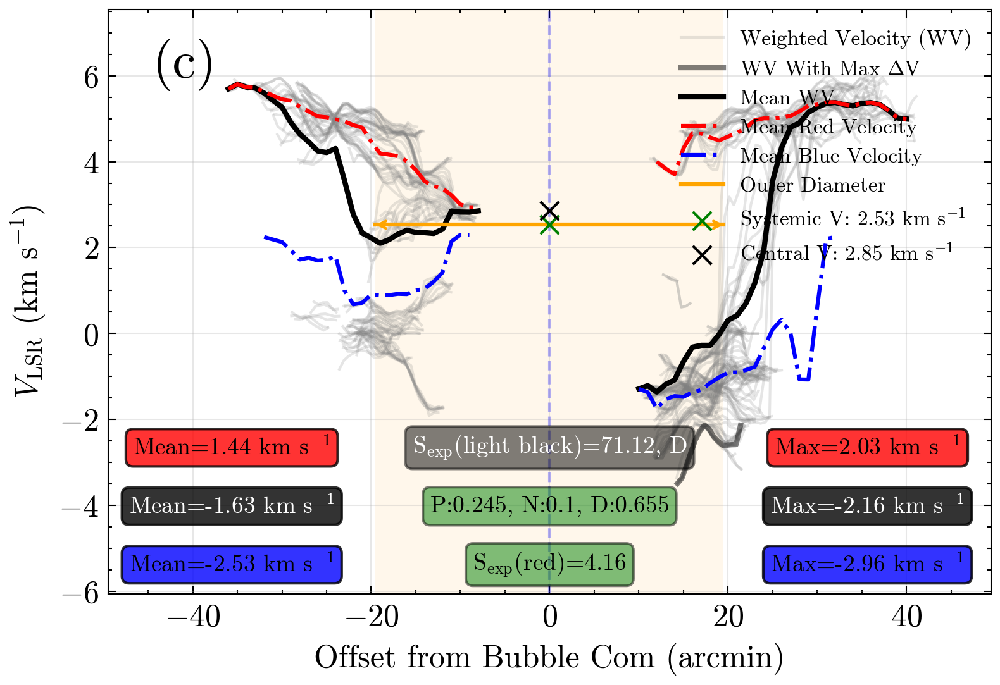

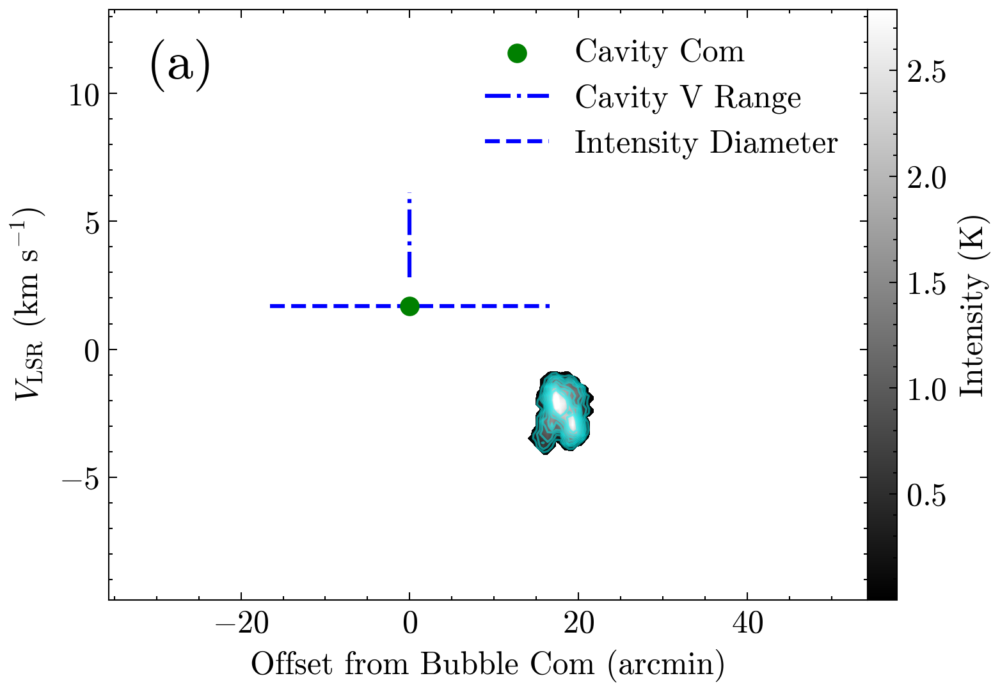

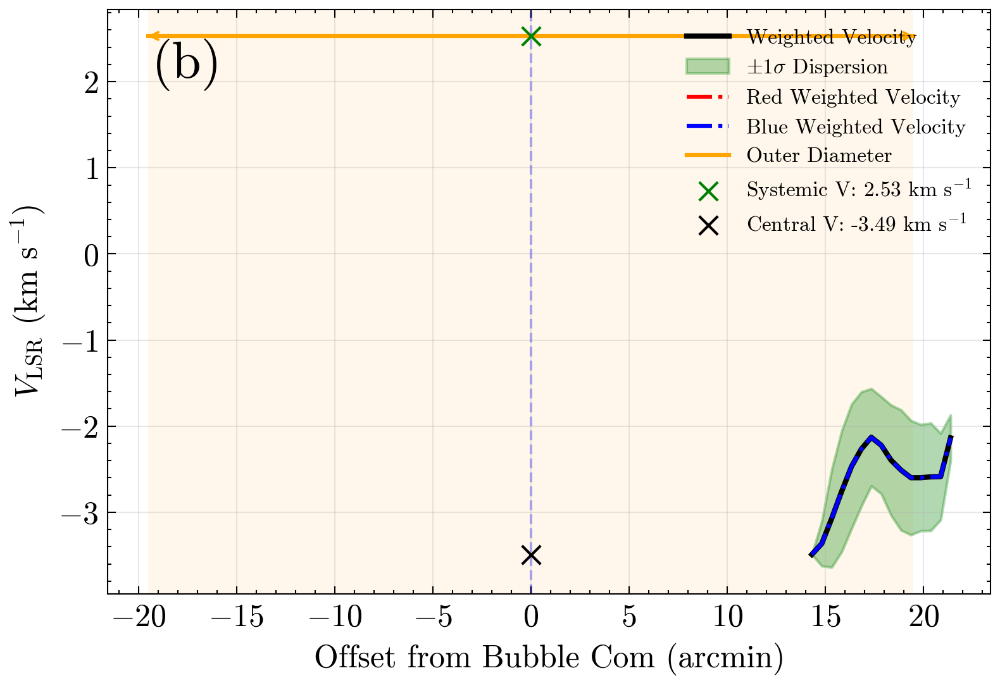

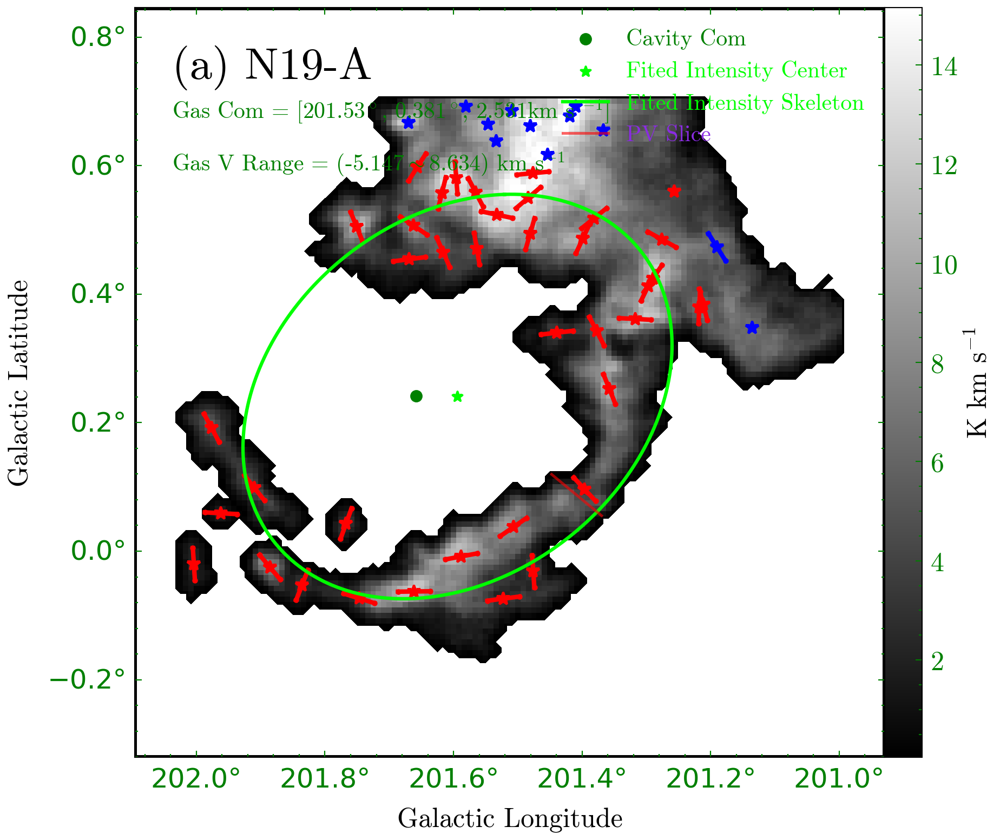

In [419]:
# Set plot parameters
fontsize = 12  # Set font size for labels and annotations
plt.rcParams['xtick.color'] = 'black'  # Set x-axis tick color
plt.rcParams['ytick.color'] = 'black'  # Set y-axis tick color

# Perform bubble morphology analysis with specific settings 

add_con = True
fixed_ec = True
half_ecoords = True
dictionary_cuts = defaultdict(list)
bubbleObj.Get_Bubble_Item_Morphology(
    index, dictionary_cuts, add_con, bubble_infor_provided,
    systemic_v_type=systemic_v_type, fixed_ec=fixed_ec, half_ecoords=half_ecoords,
    skeleton_ellipse_infor=bubbleObj.skeleton_ellipse_infor,
    skeleton_coords_ellipse=bubbleObj.skeleton_coords_ellipse
)

# Plot the radial velocity profile with the fitted data
BFPV.Cal_Radial_Velocity_Profile_Mean(bubbleObj, mean_line_num=2, width=2, exp_base='central_v')#central_v, systemic_v
ax0 = BFPl.Plot_Radial_Velocity_Profile_Mean(bubbleObj, figsize=(6, 4))
ax0.text(0.05, 0.95, '(c)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
save_path = '../Images/Imgs_PV/Velocity_Profiles_{}.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=1000)
plt.show()

# Plot the bubble's position-velocity slice at a specific line index
line_index = bubbleObj.exp_central_delta_v_arg_max  # Get the central velocity slice index
BFPV.Cal_Radial_Velocity_Profile(bubbleObj, line_index, width=2)
ax0 = BFPl.Plot_Bubble_PV_Slice(bubbleObj)
ax0.text(0.05, 0.95, '(a)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
save_path = '../Images/Imgs_PV/PV_Slice_{}.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=1000)
plt.show() 

# Plot the radial velocity profile with additional features
ax0 = BFPl.Plot_Radial_Velocity_Profile(bubbleObj)
ax0.text(0.05, 0.95, '(b)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)
save_path = '../Images/Imgs_PV/Velocity_Profile_{}.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=1000)
plt.show() 

# Set up unwrapping and plotting bubble skeleton
add_con = True  
unwrap_radius = None  # No specific radius for unwrapping
unwrap_width = None  # No specific width for unwrapping
angle_offset = None  # No angle offset for unwrapping
plt.rcParams['xtick.color'] = 'green'  # Set green x-axis ticks
plt.rcParams['ytick.color'] = 'green'  # Set green y-axis ticks

# # Get the weighted bubble skeleton data
# BFS.Get_Bubble_Skeleton_Weighted(
#     bubbleObj, unwrap_radius=unwrap_radius, unwrap_width=unwrap_width, angle_offset=angle_offset,
#     unwrap_value='max', trim_logic=True
# )

# Plot the unwrapped bubble skeleton with additional annotations
ax0 = BFPl.Plot_Unwrap_Bubble_Infor(
    bubbleObj, add_con=add_con, plot_clump=True, plot_ellipse=False, plot_contour=False,
    plot_circles=[False, False], plot_annotate=False, plot_skeleton=False, plot_skeleton_ellipse=True,
    tick_logic=True, cbar_logic=True, text_com=True, skeleton_types=['scatter', 'line'], linewidth=1.5,
    figsize=(8, 6), fontsize=12
)

# Add a red line to the plot representing the PV slice
dictionary_cuts_item = copy.deepcopy(bubbleObj.dictionary_cuts)
start = dictionary_cuts_item['plot_cuts'][line_index][0]
end = dictionary_cuts_item['plot_cuts'][line_index][1]
ax0.plot([start[0], end[0]], [start[1], end[1]], color='red', label="PV Slice", linestyle='-', markersize=8.,
         linewidth=1.2, alpha=0.6)

# Add and style the legend
legend = ax0.legend(loc='upper right', fontsize=fontsize - 2)
legend_style = [('green', 1.0), ('lime', 1.0), ('lime', 1.0), ('blueviolet', 1.0), ('red', 0.6)]
for text, (color, alpha) in zip(legend.get_texts(), legend_style):
    text.set_color(color)
    text.set_alpha(alpha)

# Annotate the plot with the label '(a)'
img_name_T = 'N19-A'
ax0.text(0.05, 0.95, '(a) {}'.format(img_name_T), color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

save_path = '../Images/Imgs_Skt/Fited_Skt_{}.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
# if save_path != None:
#     plt.savefig(save_path, format='pdf', dpi=1000)
plt.show() 

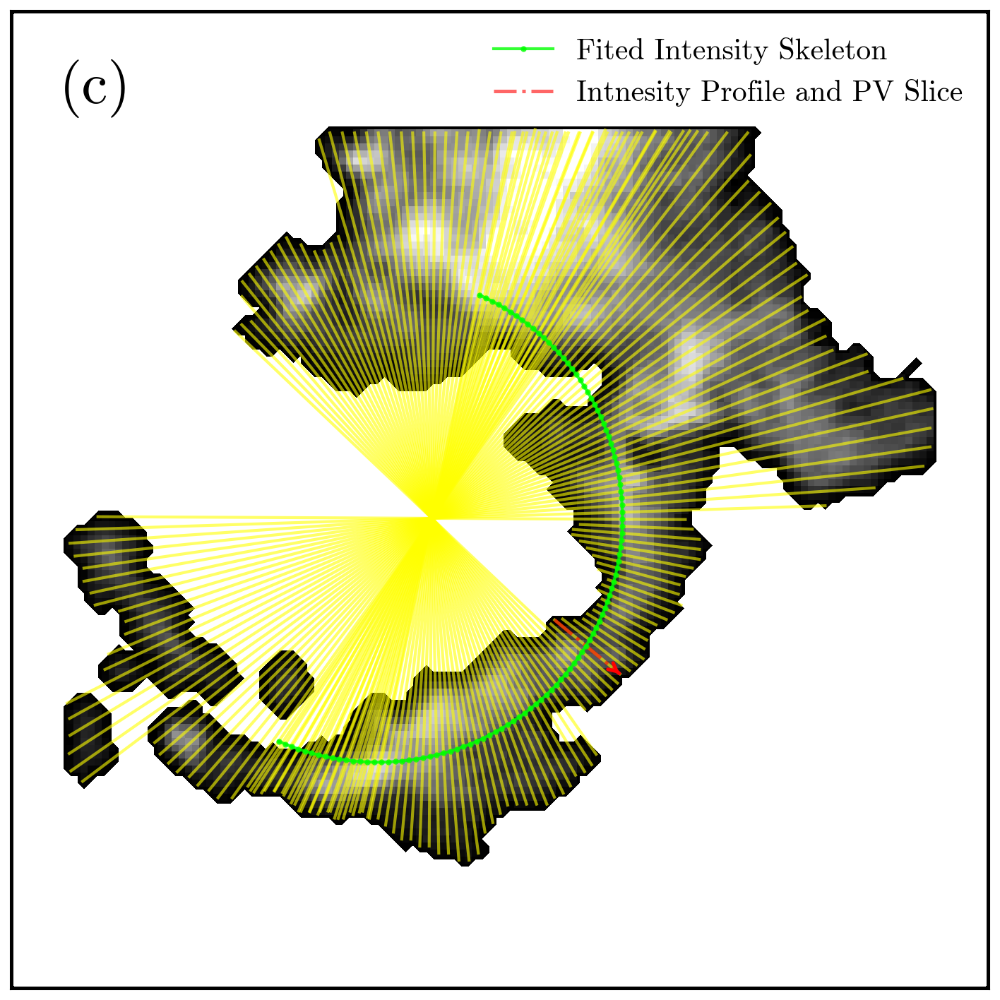

In [421]:
# Set the PV line index for plotting a specific region of the bubble
line_index = bubbleObj.exp_central_delta_v_arg_max

# Plot the bubble item with specified settings
ax0 = BFPl.Plot_Bubble_Item(
    bubbleObj, line_index=line_index, line_logics=[True,True],tick_logic=False, 
    label_e='Intensity Skeleton', color_e='lime', label_l='Intnesity Profile and PV Slice',
    figsize=(8, 6), fontsize=12, spacing=12*u.arcmin
)

# Annotate the plot with the label '(c)'
ax0.text(0.05, 0.95, '(c)', color='black', transform=ax0.transAxes, verticalalignment='top', fontsize=20)

# Save or display the plot
save_path = '../Images/Imgs_Mor/Region_Slice_{}.pdf'.format(img_name)
# Uncomment to save the plot as a PDF
if save_path != None:
    plt.savefig(save_path, format='pdf', dpi=500)

plt.show() 

### If you have any questions about this manual, please open an issue on github, or email the author. (yujiang@pmo.ac.cn)